In [1]:
import torch
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import PolynomialLR
from torch.utils.data import WeightedRandomSampler
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2

from tqdm.notebook import tqdm
import json
import cv2
import numpy as np
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import  plot_some_images ,read_images , pre_hard_skeletonize , pre_soft_skeletonize,compute_confution_matrix
from utils.preprocessing import WhiteTopHat , CLAHE , normalize_xca
from utils.dataset import  UnetDataset , ValidUnetDataset
from models.nnunet import nnUnet
from models.nnunet_blocks import nnUnetv2
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###

# Training

In [2]:
args = {
    "base_path" : "../arcade/nnUnet_dataset/syntax",
    "in_c" : 1,
    "base_channel" :32,
    "image_shape" : (512,512),
    "class_count" : 26 ,
    "attention" : False,
    "k":40,
    "batch_size" : 10,
    "num_workers" : 10,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "lr" : 0.01,
    "momentum" : 0.99,
    "weight_decay" : 3e-5,
    "epcohs":200,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "input_channels":1,
    "unet_depth":6,
    "loss_type":"tversky loss",
    "alpha":0.3,
    "beta":0.7,
    "t_gamma":2.00,
    "f_gamma":2.0,
    "f_loss_scale":1,
    "loss_coefs":{"CE":0.5,"Second":1.0},
    "output_base_path" : "./outputs",
    "name" : "NoAttention7-DSV-tev-new_augs_full",
    "deep_super_vision" : True,
    "f_alpha":None
}
class_map = {
    1: '1',2: '2', 3: '3',4: '4',
    5: '5',6: '6',7: '7',8: '8',
    9: '9',10: '9a',11: '10',12: '10a',
    13: '11',14: '12',15: '12a',16: '13',
    17: '14',18: '14a',19: '15',20: '16',
    21: '16a',22: '16b',23: '16c',
    24: '12b',25: '14b'
}
train_class_counts = [
    1000,374,375,369,303,525,525,
    340,310,198,70,21,1,320,61,
    129,305,107,49,38,232,43,48,31,63,127
]
# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","CE loss",args["loss_type"]]
out_counts = 6 if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights

[1.0, 0.5, 0.25, 0.125, 0.0625, 0.03125]

In [3]:
# with open("./data/train_class_counts.json","r") as f:
#     train_class_counts = json.load(f)

# b = 0.999999

# counts = [0]*(len(train_class_counts))
# for k,v in train_class_counts.items():
#     counts[int(k)] = int(v)
# counts = np.array(counts,dtype=np.float64)

# f_alpha = (1-b)/(1-np.power(b,counts))
# f_alpha = f_alpha / f_alpha.sum()
# f_alpha[12] = 0.25
# # args["f_alpha"] = f_alpha.tolist()
# args["f_alpha"]=None
# args["f_alpha"]

In [4]:
b=0.999
total = np.sum(train_class_counts)
f_alpha = np.log(total/np.array(train_class_counts))
f_alpha = (f_alpha / f_alpha.mean()).tolist()
f_alpha
args["f_alpha"] = f_alpha
args["f_alpha"][0] = 0.1
# args["f_alpha"]=None
f_alpha

[0.1,
 0.7142043884888621,
 0.7135157199921257,
 0.7176755875744286,
 0.7684995730881661,
 0.626737444448145,
 0.626737444448145,
 0.7387854746678001,
 0.762609126532027,
 0.8782298337841749,
 1.146393423398511,
 1.4569054728038624,
 2.2421066818356166,
 0.754420940433312,
 1.181886829838206,
 0.9887309378139343,
 0.7668028156603474,
 1.0369551595622082,
 1.238382102391938,
 1.3039506626242363,
 0.8373593505238325,
 1.2720698571238491,
 1.243699944376071,
 1.3564600952472932,
 1.1735665534939475,
 0.9927608041591397]

In [5]:
# pre_soft_skeletonize(args["base_path"],output_path=args["base_path"],batch_size=10,k=40)

In [6]:
train_transforms = A.Compose([
    # A.Resize(*args["image_shape"]),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.7),


    A.Affine(
        scale=(0.8, 1.2),             
        translate_percent=(-0.1, 0.1), 
        rotate=(-30, 30),         
        shear=(-10, 10),      
        

        fill=0,           
        fill_mask=0,                 
        border_mode=cv2.BORDER_CONSTANT, 
        
        fit_output=False,  
        p=0.7
    ),

    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),

    A.RandomBrightnessContrast(
        brightness_limit=0.2, 
        contrast_limit=0.2, 
        p=0.5
    ),

    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    
    A.Lambda(image=normalize_xca)
])
test_transforms = A.Compose([
    # A.Resize(*args["image_shape"]),
    A.Lambda(image=normalize_xca),
    ToTensorV2()
    ]  
)
# train_preprocess = v2.Compose([
#     WhiteTopHat(kernel_size=(50,50)),
#     CLAHE()
    
# ])
train_preprocess = None


In [7]:
def make_dataloader(data,args,valid=False,sampler_weights=None):
    if(sampler_weights is not None):
        print("using weighted sampler here")
        sampler = WeightedRandomSampler(sampler_weights, len(sampler_weights))
        dataloader = DataLoader(
            data,
            batch_size = args["batch_size"] ,
            num_workers = args["num_workers"] ,
            pin_memory=True,
            shuffle=False,
            sampler=sampler
        )
        
    else : 
        if(valid):
            print("valid with no sampler")
            dataloader = DataLoader(
                data,
                batch_size = args["batch_size"] ,
                num_workers = args["num_workers"] ,
                pin_memory=True,
                shuffle=False,
            )
        else : 
            print("train with no sampler")
            dataloader = DataLoader(
                data,
                batch_size = args["batch_size"] ,
                num_workers = args["num_workers"] ,
                pin_memory=True,
                shuffle=True
            )
    return dataloader

In [ ]:

train_images,sampler_weights = read_images(
    base_path = args["base_path"],
    preprocessor = train_preprocess,
    part = "train",
    train_class_counts=np.array(train_class_counts)
)
valid_images = read_images(
    base_path = args["base_path"],
    preprocessor = train_preprocess,
    part = "test",
    train_class_counts=None
)
train_ds = UnetDataset(transform = train_transforms,data = train_images,base_size=args["image_shape"][0],out_counts=out_counts)
valid_ds = ValidUnetDataset(transform = test_transforms,data = valid_images)

train_loader = make_dataloader(train_ds,args,valid=False,sampler_weights=sampler_weights)
valid_loader = make_dataloader(valid_ds,args,valid=True,sampler_weights=None)

max count is :  525
NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

using weighted sampler here
valid with no sampler


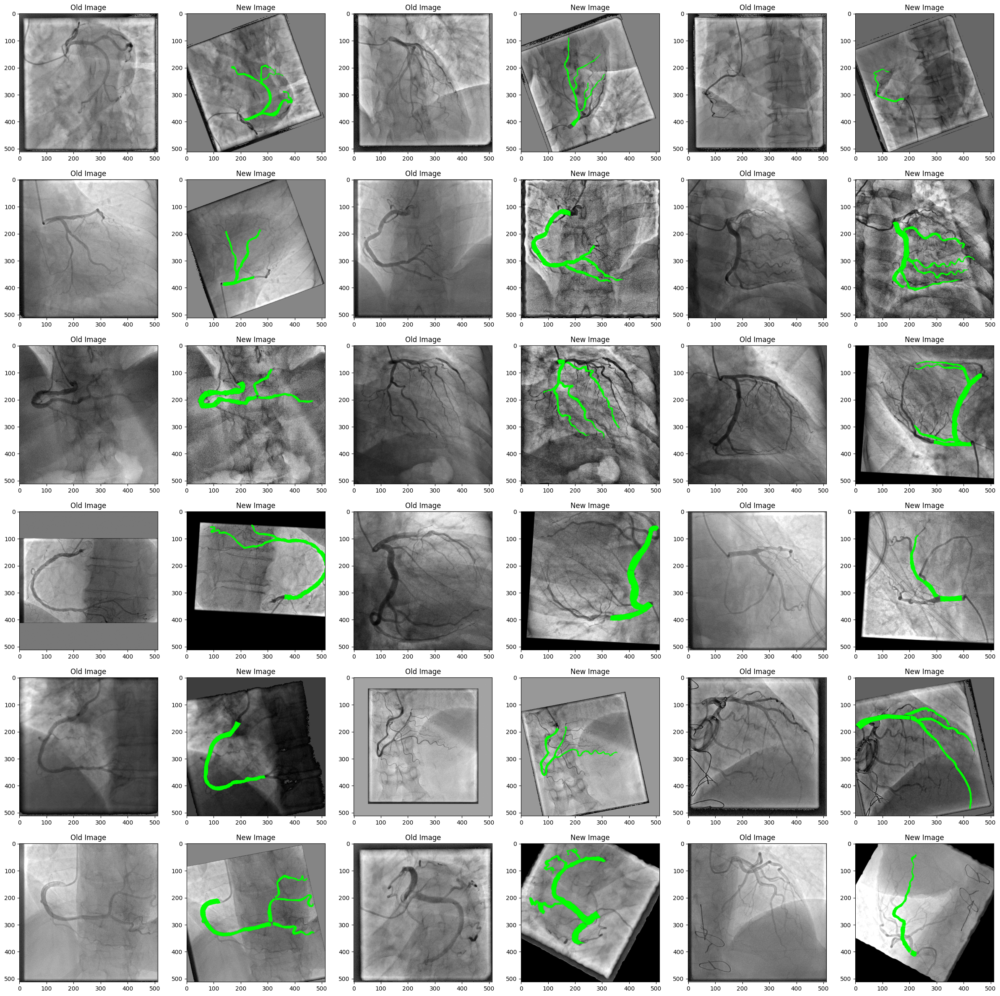

In [9]:
plot_some_images(train_images, train_transforms, image_counts=36, fig_shape=(6,6), base_transforms=test_transforms)

In [10]:
model = nnUnet(args).to(args["device"])
loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(model.parameters(), lr=args["lr"])
optimizer = torch.optim.SGD(
    model.parameters(),
    momentum=args["momentum"],
    lr=args["lr"],
    nesterov=True,
    weight_decay=args["weight_decay"]
)
lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map)

best_model =trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)

number of layers : 6
encoder settings :  [32, 64, 128, 256, 512, 512]
bottle-neck settings :  1024
decoder settings :  [1024, 512, 256, 128, 64]
head settings :  26
loss is set to tversky


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(3.2587, device='cuda:0')
current lr : 0.01
train ==> epcoh (0)
total loss : 3.3017549467086793 - CE loss : 1.3699578541517257 - tversky loss : 1.9317970597743988

train avg metrics for epoch 0 :
avg dice : 0.0008682798487009767 - avg precision : 0.0012433963973307982 - avg recall : 0.0022588472536699557
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 1.5028366923332215 - CE loss : 0.5236436799168587 - tversky loss : 0.9791930198669434

valid avg metrics for epoch 0 :
avg dice : 4.2089329715727303e-13 - avg precision : 0.0 - avg recall : 0.0
------------------------------------------------------------
New Best! : dice = 4.2089332778598443e-13


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009955
train ==> epcoh (1)
total loss : 2.882784752845764 - CE loss : 0.9768381667137146 - tversky loss : 1.9059465682506562

train avg metrics for epoch 1 :
avg dice : 3.135562336473198e-06 - avg precision : 0.004133738577365875 - avg recall : 1.568376028444618e-06
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 1.435587430000305 - CE loss : 0.4667524561285973 - tversky loss : 0.968834987282753

valid avg metrics for epoch 1 :
avg dice : 0.0003961532939686505 - avg precision : 0.009118170142173768 - avg recall : 0.00020247507840394973
------------------------------------------------------------
New Best! : dice = 0.0003961533075198531


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00991
train ==> epcoh (2)
total loss : 2.7733638453483582 - CE loss : 0.9025088953971863 - tversky loss : 1.8708549690246583

train avg metrics for epoch 2 :
avg dice : 0.010004913806957772 - avg precision : 0.00728121280670166 - avg recall : 0.015984139442443847
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 1.4008288145065309 - CE loss : 0.43918143808841703 - tversky loss : 0.9616473644971848

valid avg metrics for epoch 2 :
avg dice : 0.009736632705153438 - avg precision : 0.0058845853805542 - avg recall : 0.028189406394958497
------------------------------------------------------------
New Best! : dice = 0.00973663292825222


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009865
train ==> epcoh (3)
total loss : 2.6986923718452456 - CE loss : 0.8545505237579346 - tversky loss : 1.8441418242454528

train avg metrics for epoch 3 :
avg dice : 0.008922894597096958 - avg precision : 0.00515460193157196 - avg recall : 0.0331772780418396
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 1.3912833750247955 - CE loss : 0.4321589142084122 - tversky loss : 0.9591244637966156

valid avg metrics for epoch 3 :
avg dice : 0.00843072116416833 - avg precision : 0.004811360239982605 - avg recall : 0.03402958154678345
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00982
train ==> epcoh (4)
total loss : 2.6304357767105104 - CE loss : 0.8181068825721741 - tversky loss : 1.8123288750648499

train avg metrics for epoch 4 :
avg dice : 0.008055869340941902 - avg precision : 0.0045229047536849976 - avg recall : 0.03680618524551391
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 1.3778520464897155 - CE loss : 0.42256464511156083 - tversky loss : 0.9552874147891999

valid avg metrics for epoch 4 :
avg dice : 0.007524459362448665 - avg precision : 0.004189662039279938 - avg recall : 0.036877098083496096
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009775
train ==> epcoh (5)
total loss : 2.573298463821411 - CE loss : 0.7989974927902221 - tversky loss : 1.7743009638786316

train avg metrics for epoch 5 :
avg dice : 0.00702857757922859 - avg precision : 0.004799471125006676 - avg recall : 0.037106810614350255
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 1.370454204082489 - CE loss : 0.41775768250226974 - tversky loss : 0.9526965230703354

valid avg metrics for epoch 5 :
avg dice : 0.007367014417373511 - avg precision : 0.00438923466950655 - avg recall : 0.03688933160272427
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00973
train ==> epcoh (6)
total loss : 2.502558562755585 - CE loss : 0.7784952020645142 - tversky loss : 1.7240633702278136

train avg metrics for epoch 6 :
avg dice : 0.007994800077326477 - avg precision : 0.006653511747717857 - avg recall : 0.036214288373594174
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 1.3640244483947754 - CE loss : 0.4134584620594978 - tversky loss : 0.9505659759044647

valid avg metrics for epoch 6 :
avg dice : 0.009870797694143764 - avg precision : 0.0063540078699588776 - avg recall : 0.036727017760276794
------------------------------------------------------------
New Best! : dice = 0.009870797395706177


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009684
train ==> epcoh (7)
total loss : 2.4223028016090393 - CE loss : 0.7468826800584794 - tversky loss : 1.6754201197624206

train avg metrics for epoch 7 :
avg dice : 0.011284814551515605 - avg precision : 0.008777318149805069 - avg recall : 0.037408452406525614
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 1.3553892195224762 - CE loss : 0.40855680108070375 - tversky loss : 0.946832412481308

valid avg metrics for epoch 7 :
avg dice : 0.017486667037420932 - avg precision : 0.01149042770266533 - avg recall : 0.04522160470485687
------------------------------------------------------------
New Best! : dice = 0.01748666726052761


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8458, device='cuda:0')
current lr : 0.009639
train ==> epcoh (8)
total loss : 2.3576353192329407 - CE loss : 0.7277878373861313 - tversky loss : 1.6298474860191345

train avg metrics for epoch 8 :
avg dice : 0.01828174073020518 - avg precision : 0.023209668397903442 - avg recall : 0.04768745357592707
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 1.3458996832370758 - CE loss : 0.40491840839385984 - tversky loss : 0.9409812718629837

valid avg metrics for epoch 8 :
avg dice : 0.019703922436281676 - avg precision : 0.015818635523319243 - avg recall : 0.057665495226974596
------------------------------------------------------------
New Best! : dice = 0.019703922793269157


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009594
train ==> epcoh (9)
total loss : 2.2710684895515443 - CE loss : 0.7047619313001633 - tversky loss : 1.5663065147399902

train avg metrics for epoch 9 :
avg dice : 0.023776822797994857 - avg precision : 0.022580566108226775 - avg recall : 0.0628142204345204
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 1.3213887095451355 - CE loss : 0.391791495680809 - tversky loss : 0.9295972049236297

valid avg metrics for epoch 9 :
avg dice : 0.025478275753962533 - avg precision : 0.022056739330291748 - avg recall : 0.07963575227186084
1 => dice : 7.779618827396736e-14 p : 0.0 , r : 0.0
2 => dice : 7.042799096733734e-14 p : 0.0 , r : 0.0
3 => dice : 8.138749277384477e-14 p : 0.0 , r : 0.0
4 => dice : 1.142556779439377e-13 p : 0.0 , r : 0.0
5 => dice : 6.149040423977098e-14 p : 0.0 , r : 0.0
6 => dice : 0.260270357131958 p : 0.15586215257644653 , r : 0.7883999943733215
7 => dice : 0.007106752134859562 p : 0.12082032859325409 , r : 0

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009549
train ==> epcoh (10)
total loss : 2.1295222890377046 - CE loss : 0.650313130915165 - tversky loss : 1.4792091691493987

train avg metrics for epoch 10 :
avg dice : 0.0388652972877442 - avg precision : 0.028274701833724977 - avg recall : 0.09390761055052281
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (10)
total loss : 1.287051123380661 - CE loss : 0.3828487306833267 - tversky loss : 0.9042023926973343

valid avg metrics for epoch 10 :
avg dice : 0.029781607940488435 - avg precision : 0.020987564846873284 - avg recall : 0.09812731809477554
------------------------------------------------------------
New Best! : dice = 0.029781607910990715


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009504
train ==> epcoh (11)
total loss : 2.055807272195816 - CE loss : 0.6348849567770958 - tversky loss : 1.420922313928604

train avg metrics for epoch 11 :
avg dice : 0.04928728969304923 - avg precision : 0.06767242617905139 - avg recall : 0.11231355889001861
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (11)
total loss : 1.2626187682151795 - CE loss : 0.38545437455177306 - tversky loss : 0.8771643787622452

valid avg metrics for epoch 11 :
avg dice : 0.07051157562087879 - avg precision : 0.053436505421996114 - avg recall : 0.1385593458637595
------------------------------------------------------------
New Best! : dice = 0.07051157206296921


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009458
train ==> epcoh (12)
total loss : 1.9964599156379699 - CE loss : 0.6231344392895699 - tversky loss : 1.373325479030609

train avg metrics for epoch 12 :
avg dice : 0.08807227851345485 - avg precision : 0.07121826188638807 - avg recall : 0.15657338515404262
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (12)
total loss : 1.2091413259506225 - CE loss : 0.3616433128714561 - tversky loss : 0.8474980175495148

valid avg metrics for epoch 12 :
avg dice : 0.08314062278736667 - avg precision : 0.06760447816923261 - avg recall : 0.16392603159416466
------------------------------------------------------------
New Best! : dice = 0.08314061909914017


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009413
train ==> epcoh (13)
total loss : 1.9306832730770112 - CE loss : 0.6133174526691437 - tversky loss : 1.3173658072948455

train avg metrics for epoch 13 :
avg dice : 0.13018386530692463 - avg precision : 0.14389420211315154 - avg recall : 0.20951954582647886
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (13)
total loss : 1.1501082181930542 - CE loss : 0.3495893105864525 - tversky loss : 0.8005189180374146

valid avg metrics for epoch 13 :
avg dice : 0.12521243495892714 - avg precision : 0.10622233025729656 - avg recall : 0.19675777350552381
------------------------------------------------------------
New Best! : dice = 0.1252124309539795


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.8175, device='cuda:0')
current lr : 0.009368
train ==> epcoh (14)
total loss : 1.7926801311969758 - CE loss : 0.5666572934389115 - tversky loss : 1.2260228157043458

train avg metrics for epoch 14 :
avg dice : 0.17283039608041173 - avg precision : 0.1494147187843919 - avg recall : 0.26623123308527286
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (14)
total loss : 1.0632090657949447 - CE loss : 0.34322388768196105 - tversky loss : 0.7199851751327515

valid avg metrics for epoch 14 :
avg dice : 0.15821001815389152 - avg precision : 0.12707414938136935 - avg recall : 0.2641189581004437
------------------------------------------------------------
New Best! : dice = 0.15821000933647156


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(2.3689, device='cuda:0')
current lr : 0.009322
train ==> epcoh (15)
total loss : 1.6544982969760895 - CE loss : 0.5360542458295822 - tversky loss : 1.118444055914879

train avg metrics for epoch 15 :
avg dice : 0.22823649871251298 - avg precision : 0.21986172331031412 - avg recall : 0.3131310430631856
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (15)
total loss : 0.9604121267795562 - CE loss : 0.3062691830098629 - tversky loss : 0.6541429460048676

valid avg metrics for epoch 15 :
avg dice : 0.2500455906336093 - avg precision : 0.2357103581726551 - avg recall : 0.32125729103107004
------------------------------------------------------------
New Best! : dice = 0.2500455975532532


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009277
train ==> epcoh (16)
total loss : 1.5600740694999695 - CE loss : 0.5133379152417183 - tversky loss : 1.0467361515760423

train avg metrics for epoch 16 :
avg dice : 0.3019990179990472 - avg precision : 0.28983699712902306 - avg recall : 0.37801936005969766
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (16)
total loss : 0.9155296444892883 - CE loss : 0.3019738279283047 - tversky loss : 0.6135558158159256

valid avg metrics for epoch 16 :
avg dice : 0.278694633625084 - avg precision : 0.2686569200828671 - avg recall : 0.35061378942569715
------------------------------------------------------------
New Best! : dice = 0.27869459986686707


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.5183, device='cuda:0')
current lr : 0.009232
train ==> epcoh (17)
total loss : 1.4565118479728698 - CE loss : 0.5011452087759971 - tversky loss : 0.9553666490316391

train avg metrics for epoch 17 :
avg dice : 0.35680241862311957 - avg precision : 0.32037202402949333 - avg recall : 0.42909922665916383
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (17)
total loss : 0.8366842865943909 - CE loss : 0.2996624559164047 - tversky loss : 0.5370218351483345

valid avg metrics for epoch 17 :
avg dice : 0.31558669178038107 - avg precision : 0.2816094762086868 - avg recall : 0.39584322023336427
------------------------------------------------------------
New Best! : dice = 0.3155866861343384


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009186
train ==> epcoh (18)
total loss : 1.3813459306955338 - CE loss : 0.48460312515497206 - tversky loss : 0.8967428135871888

train avg metrics for epoch 18 :
avg dice : 0.37963787525892256 - avg precision : 0.333580192476511 - avg recall : 0.4555915489792824
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (18)
total loss : 0.8095524460077286 - CE loss : 0.2870702318847179 - tversky loss : 0.5224822193384171

valid avg metrics for epoch 18 :
avg dice : 0.317282310883772 - avg precision : 0.3025979748368263 - avg recall : 0.37781726419401823
------------------------------------------------------------
New Best! : dice = 0.3172823190689087


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009141
train ==> epcoh (19)
total loss : 1.379303715825081 - CE loss : 0.4824332091212273 - tversky loss : 0.8968705058097839

train avg metrics for epoch 19 :
avg dice : 0.3866365718841553 - avg precision : 0.34151301085948943 - avg recall : 0.4627858531475067
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (19)
total loss : 0.8024269551038742 - CE loss : 0.2802158251404762 - tversky loss : 0.5222111344337463

valid avg metrics for epoch 19 :
avg dice : 0.3141158727184391 - avg precision : 0.3232205165922642 - avg recall : 0.4107779884431511
1 => dice : 0.6876012682914734 p : 0.5918500423431396 , r : 0.8203141689300537
2 => dice : 0.6295809149742126 p : 0.6370177268981934 , r : 0.6223158240318298
3 => dice : 0.5604938268661499 p : 0.5711847543716431 , r : 0.5501957535743713
4 => dice : 0.4600725471973419 p : 0.3705761730670929 , r : 0.6065605878829956
5 => dice : 0.7034777402877808 p : 0.6423563361167908 , r : 0.7774538993835449
6 => dice : 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009095
train ==> epcoh (20)
total loss : 1.3086586064100265 - CE loss : 0.45111175030469897 - tversky loss : 0.8575468760728836

train avg metrics for epoch 20 :
avg dice : 0.40307664692401884 - avg precision : 0.3538371016085148 - avg recall : 0.48420787289738654
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (20)
total loss : 0.76309714615345 - CE loss : 0.26993383914232255 - tversky loss : 0.49316330403089526

valid avg metrics for epoch 20 :
avg dice : 0.32745367050180896 - avg precision : 0.28834965884685515 - avg recall : 0.43008385837078095
------------------------------------------------------------
New Best! : dice = 0.32745370268821716


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00905
train ==> epcoh (21)
total loss : 1.2769220304489135 - CE loss : 0.44024846762418746 - tversky loss : 0.8366735517978668

train avg metrics for epoch 21 :
avg dice : 0.41947598367929456 - avg precision : 0.3700902125239372 - avg recall : 0.498172844350338
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (21)
total loss : 0.7841323584318161 - CE loss : 0.27370945662260054 - tversky loss : 0.5104228988289833

valid avg metrics for epoch 21 :
avg dice : 0.312692137118508 - avg precision : 0.2872285393625498 - avg recall : 0.4240172971272841
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.009004
train ==> epcoh (22)
total loss : 1.1987986719608308 - CE loss : 0.4151412999629974 - tversky loss : 0.7836573714017868

train avg metrics for epoch 22 :
avg dice : 0.4248892736528069 - avg precision : 0.3752925233542919 - avg recall : 0.511799591993913
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (22)
total loss : 0.7239846736192703 - CE loss : 0.24652476832270623 - tversky loss : 0.4774599075317383

valid avg metrics for epoch 22 :
avg dice : 0.3588922205568617 - avg precision : 0.32523938223719595 - avg recall : 0.4397785048186779
------------------------------------------------------------
New Best! : dice = 0.35889220237731934


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008959
train ==> epcoh (23)
total loss : 1.1791414719820024 - CE loss : 0.4051543943583965 - tversky loss : 0.7739870798587799

train avg metrics for epoch 23 :
avg dice : 0.4353179827332497 - avg precision : 0.38332190841436387 - avg recall : 0.5202329001575708
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (23)
total loss : 0.7346596956253052 - CE loss : 0.25936802476644516 - tversky loss : 0.4752916693687439

valid avg metrics for epoch 23 :
avg dice : 0.3383092380129083 - avg precision : 0.3055708861351013 - avg recall : 0.4436489405669272
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008913
train ==> epcoh (24)
total loss : 1.176288367509842 - CE loss : 0.401752377897501 - tversky loss : 0.7745359802246093

train avg metrics for epoch 24 :
avg dice : 0.4431489510834217 - avg precision : 0.38966112703084943 - avg recall : 0.5321391129493713
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (24)
total loss : 0.7056193858385086 - CE loss : 0.24390153214335442 - tversky loss : 0.46171785444021224

valid avg metrics for epoch 24 :
avg dice : 0.3405037024338044 - avg precision : 0.3119934020191431 - avg recall : 0.44839911625254897
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008868
train ==> epcoh (25)
total loss : 1.144755238890648 - CE loss : 0.38467241436243055 - tversky loss : 0.7600828158855438

train avg metrics for epoch 25 :
avg dice : 0.45447487995028496 - avg precision : 0.4000903308391571 - avg recall : 0.5406691838800907
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (25)
total loss : 0.677684098482132 - CE loss : 0.23093751221895217 - tversky loss : 0.44674658477306367

valid avg metrics for epoch 25 :
avg dice : 0.3636623620416652 - avg precision : 0.3448892629146576 - avg recall : 0.4514838664936542
------------------------------------------------------------
New Best! : dice = 0.36366236209869385


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008822
train ==> epcoh (26)
total loss : 1.121819753050804 - CE loss : 0.38348472729325295 - tversky loss : 0.7383350163698197

train avg metrics for epoch 26 :
avg dice : 0.4573312491178513 - avg precision : 0.4027218845486641 - avg recall : 0.5465015661716461
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (26)
total loss : 0.7463994979858398 - CE loss : 0.2734489805996418 - tversky loss : 0.4729505106806755

valid avg metrics for epoch 26 :
avg dice : 0.3490973989293225 - avg precision : 0.32375483624637125 - avg recall : 0.45145876582711936
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008776
train ==> epcoh (27)
total loss : 1.117611295580864 - CE loss : 0.37609997153282165 - tversky loss : 0.74151132106781

train avg metrics for epoch 27 :
avg dice : 0.451655191630125 - avg precision : 0.39437325686216357 - avg recall : 0.5485759618878364
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (27)
total loss : 0.702578929066658 - CE loss : 0.23749118447303771 - tversky loss : 0.46508773863315583

valid avg metrics for epoch 27 :
avg dice : 0.37112265512357295 - avg precision : 0.3284558342397213 - avg recall : 0.46554927825927733
------------------------------------------------------------
New Best! : dice = 0.37112265825271606


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008731
train ==> epcoh (28)
total loss : 1.1236955207586288 - CE loss : 0.393475421667099 - tversky loss : 0.7302200946211815

train avg metrics for epoch 28 :
avg dice : 0.457704423815012 - avg precision : 0.40208777368068693 - avg recall : 0.5481330693513154
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (28)
total loss : 0.6864521384239197 - CE loss : 0.23034066408872605 - tversky loss : 0.4561114728450775

valid avg metrics for epoch 28 :
avg dice : 0.386052929982543 - avg precision : 0.35588270153850315 - avg recall : 0.4746272986289114
------------------------------------------------------------
New Best! : dice = 0.3860529363155365


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008685
train ==> epcoh (29)
total loss : 1.086629918217659 - CE loss : 0.37065182998776436 - tversky loss : 0.7159780809283256

train avg metrics for epoch 29 :
avg dice : 0.4793689565360546 - avg precision : 0.4222718295454979 - avg recall : 0.5700985237956047
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (29)
total loss : 0.6877853751182557 - CE loss : 0.2400108888745308 - tversky loss : 0.44777448773384093

valid avg metrics for epoch 29 :
avg dice : 0.37384929731488226 - avg precision : 0.3440325543284416 - avg recall : 0.4710052249580622
1 => dice : 0.7334495782852173 p : 0.6943440437316895 , r : 0.7772228121757507
2 => dice : 0.6651908159255981 p : 0.7415078282356262 , r : 0.6031171679496765
3 => dice : 0.7115846276283264 p : 0.6911317110061646 , r : 0.7332850694656372
4 => dice : 0.5025759339332581 p : 0.3646967113018036 , r : 0.8080847263336182
5 => dice : 0.719309389591217 p : 0.6573523879051208 , r : 0.7941608428955078
6 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008639
train ==> epcoh (30)
total loss : 1.037289792895317 - CE loss : 0.35292759984731675 - tversky loss : 0.6843622010946274

train avg metrics for epoch 30 :
avg dice : 0.49658204436302184 - avg precision : 0.43862002313137055 - avg recall : 0.5855865761637687
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (30)
total loss : 0.6786312341690064 - CE loss : 0.23557730987668038 - tversky loss : 0.44305392652750014

valid avg metrics for epoch 30 :
avg dice : 0.37475622322410346 - avg precision : 0.34094580709934236 - avg recall : 0.4722096827439964
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008594
train ==> epcoh (31)
total loss : 1.0807303065061569 - CE loss : 0.36711959809064865 - tversky loss : 0.7136107096076012

train avg metrics for epoch 31 :
avg dice : 0.4813685129582882 - avg precision : 0.42452792078256607 - avg recall : 0.5687739878892899
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (31)
total loss : 0.7222947031259537 - CE loss : 0.25257679224014284 - tversky loss : 0.46971791684627534

valid avg metrics for epoch 31 :
avg dice : 0.36466056391596796 - avg precision : 0.34705089576542375 - avg recall : 0.4427837362885475
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008548
train ==> epcoh (32)
total loss : 1.0758075630664825 - CE loss : 0.3617744125425816 - tversky loss : 0.7140331557393074

train avg metrics for epoch 32 :
avg dice : 0.4857688242197037 - avg precision : 0.42613207042217255 - avg recall : 0.5742568576335907
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (32)
total loss : 0.7092532455921173 - CE loss : 0.2575449630618095 - tversky loss : 0.4517082780599594

valid avg metrics for epoch 32 :
avg dice : 0.38604987513273953 - avg precision : 0.3554968470707536 - avg recall : 0.46509306646883486
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008502
train ==> epcoh (33)
total loss : 0.9884478169679641 - CE loss : 0.33281334772706034 - tversky loss : 0.6556344726681709

train avg metrics for epoch 33 :
avg dice : 0.49926264464855197 - avg precision : 0.4400488457083702 - avg recall : 0.5966361224651336
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (33)
total loss : 0.6738429576158523 - CE loss : 0.24223105162382125 - tversky loss : 0.4316119015216827

valid avg metrics for epoch 33 :
avg dice : 0.3991835601767666 - avg precision : 0.3568589984625578 - avg recall : 0.4961552128952462
------------------------------------------------------------
New Best! : dice = 0.39918357133865356


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008456
train ==> epcoh (34)
total loss : 0.9760730201005936 - CE loss : 0.3379067343473434 - tversky loss : 0.6381662935018539

train avg metrics for epoch 34 :
avg dice : 0.5115963059663773 - avg precision : 0.4510231092572212 - avg recall : 0.6050477156043053
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (34)
total loss : 0.6333232372999191 - CE loss : 0.20883797183632852 - tversky loss : 0.4244852676987648

valid avg metrics for epoch 34 :
avg dice : 0.4027399202808886 - avg precision : 0.3779017423093319 - avg recall : 0.47004984531551597
------------------------------------------------------------
New Best! : dice = 0.402739942073822


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00841
train ==> epcoh (35)
total loss : 0.9885227459669114 - CE loss : 0.33506682723760606 - tversky loss : 0.653455921113491

train avg metrics for epoch 35 :
avg dice : 0.5060590144991874 - avg precision : 0.44438753604888914 - avg recall : 0.6014220714569092
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (35)
total loss : 0.6243537053465843 - CE loss : 0.21019480302929877 - tversky loss : 0.41415890008211137

valid avg metrics for epoch 35 :
avg dice : 0.4115446689726022 - avg precision : 0.37980048298835756 - avg recall : 0.48526779174804685
------------------------------------------------------------
New Best! : dice = 0.41154465079307556


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008364
train ==> epcoh (36)
total loss : 0.9658802872896195 - CE loss : 0.3336885264515877 - tversky loss : 0.632191753089428

train avg metrics for epoch 36 :
avg dice : 0.5090876811742783 - avg precision : 0.45196382284164427 - avg recall : 0.5984467354416847
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (36)
total loss : 0.6398195445537567 - CE loss : 0.2124960720539093 - tversky loss : 0.42732347548007965

valid avg metrics for epoch 36 :
avg dice : 0.40639046356082936 - avg precision : 0.37048907309770585 - avg recall : 0.47985406741499903
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008318
train ==> epcoh (37)
total loss : 0.9727163326740265 - CE loss : 0.3216356080770493 - tversky loss : 0.6510807359218598

train avg metrics for epoch 37 :
avg dice : 0.5170100200176239 - avg precision : 0.4573569905757904 - avg recall : 0.6066789704561234
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (37)
total loss : 0.6525520130991935 - CE loss : 0.22551135048270227 - tversky loss : 0.42704065442085265

valid avg metrics for epoch 37 :
avg dice : 0.40372272983193397 - avg precision : 0.376769514977932 - avg recall : 0.466207707375288
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008272
train ==> epcoh (38)
total loss : 0.9327747112512589 - CE loss : 0.31692986384034155 - tversky loss : 0.6158448427915573

train avg metrics for epoch 38 :
avg dice : 0.5212266683578491 - avg precision : 0.45841214179992673 - avg recall : 0.6168424999713897
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (38)
total loss : 0.6109998196363449 - CE loss : 0.20203096568584442 - tversky loss : 0.4089688539505005

valid avg metrics for epoch 38 :
avg dice : 0.4260207358468324 - avg precision : 0.40064458817243576 - avg recall : 0.49472388725727795
------------------------------------------------------------
New Best! : dice = 0.4260207414627075


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008227
train ==> epcoh (39)
total loss : 0.9305285954475403 - CE loss : 0.3200459413230419 - tversky loss : 0.6104826563596726

train avg metrics for epoch 39 :
avg dice : 0.530029519200325 - avg precision : 0.4667985337972641 - avg recall : 0.6261088535189628
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (39)
total loss : 0.6466904670000077 - CE loss : 0.2238859161734581 - tversky loss : 0.42280455231666564

valid avg metrics for epoch 39 :
avg dice : 0.41029156863699745 - avg precision : 0.38967201560735704 - avg recall : 0.4841459318995476
1 => dice : 0.7651907801628113 p : 0.6756671667098999 , r : 0.8820610046386719
2 => dice : 0.7326284646987915 p : 0.7482486963272095 , r : 0.717647135257721
3 => dice : 0.7344805598258972 p : 0.6804014444351196 , r : 0.7978985905647278
4 => dice : 0.611903965473175 p : 0.4917401671409607 , r : 0.8097871541976929
5 => dice : 0.755108654499054 p : 0.7158623337745667 , r : 0.7989079356193542
6 => dice : 0

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008181
train ==> epcoh (40)
total loss : 0.9394910579919815 - CE loss : 0.31780869588255883 - tversky loss : 0.6216823571920395

train avg metrics for epoch 40 :
avg dice : 0.5246317881345749 - avg precision : 0.46006698310375216 - avg recall : 0.6247005438804627
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (40)
total loss : 0.6205855429172515 - CE loss : 0.19931979328393937 - tversky loss : 0.42126575112342834

valid avg metrics for epoch 40 :
avg dice : 0.4183858212829692 - avg precision : 0.3877149610221386 - avg recall : 0.4949705538153648
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008134
train ==> epcoh (41)
total loss : 0.9316989535093307 - CE loss : 0.32225691482424734 - tversky loss : 0.6094420292973518

train avg metrics for epoch 41 :
avg dice : 0.5384197002649307 - avg precision : 0.4722947865724564 - avg recall : 0.6398769932985305
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (41)
total loss : 0.7146511822938919 - CE loss : 0.2623964577913284 - tversky loss : 0.45225472152233126

valid avg metrics for epoch 41 :
avg dice : 0.39272389009605463 - avg precision : 0.3663902559876442 - avg recall : 0.4626321214437485
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.008088
train ==> epcoh (42)
total loss : 0.9026546460390091 - CE loss : 0.30919337034225464 - tversky loss : 0.593461280465126

train avg metrics for epoch 42 :
avg dice : 0.5417800694704056 - avg precision : 0.477014622092247 - avg recall : 0.6376889455318451
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (42)
total loss : 0.630901663005352 - CE loss : 0.21655524596571923 - tversky loss : 0.41434641778469083

valid avg metrics for epoch 42 :
avg dice : 0.41392522854963315 - avg precision : 0.4148222444951534 - avg recall : 0.4948843331867829
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7041, device='cuda:0')
current lr : 0.008042
train ==> epcoh (43)
total loss : 0.8924030822515487 - CE loss : 0.30551236897706985 - tversky loss : 0.5868907049298286

train avg metrics for epoch 43 :
avg dice : 0.537430218681693 - avg precision : 0.4747853809595108 - avg recall : 0.6384183980152011
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (43)
total loss : 0.6325358062982559 - CE loss : 0.21665118336677552 - tversky loss : 0.4158846244215965

valid avg metrics for epoch 43 :
avg dice : 0.4134373255075227 - avg precision : 0.38703652217984197 - avg recall : 0.4918967202305794
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007996
train ==> epcoh (44)
total loss : 0.948865783214569 - CE loss : 0.3243724325299263 - tversky loss : 0.6244933503866196

train avg metrics for epoch 44 :
avg dice : 0.5267168438434601 - avg precision : 0.4616230493783951 - avg recall : 0.6260174638032914
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (44)
total loss : 0.6432702332735062 - CE loss : 0.22235560417175293 - tversky loss : 0.42091463059186934

valid avg metrics for epoch 44 :
avg dice : 0.4130892091989517 - avg precision : 0.38421834394335747 - avg recall : 0.5001262230798602
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7882, device='cuda:0')
current lr : 0.00795
train ==> epcoh (45)
total loss : 0.9232876384258271 - CE loss : 0.3106388208270073 - tversky loss : 0.6126488158106804

train avg metrics for epoch 45 :
avg dice : 0.5355872285366058 - avg precision : 0.4740890979766846 - avg recall : 0.6291010847687721
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (45)
total loss : 0.6428853735327721 - CE loss : 0.22876641973853112 - tversky loss : 0.4141189530491829

valid avg metrics for epoch 45 :
avg dice : 0.41017649561166764 - avg precision : 0.3887160405516624 - avg recall : 0.4949780808389187
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007904
train ==> epcoh (46)
total loss : 0.9165903997421264 - CE loss : 0.3067903506755829 - tversky loss : 0.6098000594973564

train avg metrics for epoch 46 :
avg dice : 0.5365108561515808 - avg precision : 0.4714111989736557 - avg recall : 0.6338763165473938
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (46)
total loss : 0.6560997039079666 - CE loss : 0.22772098779678346 - tversky loss : 0.42837871611118317

valid avg metrics for epoch 46 :
avg dice : 0.41098951786766585 - avg precision : 0.3729427783191204 - avg recall : 0.5034978061914444
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007858
train ==> epcoh (47)
total loss : 0.8739579600095749 - CE loss : 0.30360596016049385 - tversky loss : 0.5703520011901856

train avg metrics for epoch 47 :
avg dice : 0.5515706044435501 - avg precision : 0.4865116548538208 - avg recall : 0.6499437665939332
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (47)
total loss : 0.6039264559745788 - CE loss : 0.20629656054079532 - tversky loss : 0.3976298958063126

valid avg metrics for epoch 47 :
avg dice : 0.42232954300950554 - avg precision : 0.38304401412606237 - avg recall : 0.4955043296515942
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(2.5583, device='cuda:0')
current lr : 0.007811
train ==> epcoh (48)
total loss : 0.866188178062439 - CE loss : 0.2845938777923584 - tversky loss : 0.5815942987799645

train avg metrics for epoch 48 :
avg dice : 0.5535952126979828 - avg precision : 0.4867684888839722 - avg recall : 0.6548246937990189
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (48)
total loss : 0.6211318984627724 - CE loss : 0.22061722427606584 - tversky loss : 0.40051467567682264

valid avg metrics for epoch 48 :
avg dice : 0.4261348753795028 - avg precision : 0.39978437080979345 - avg recall : 0.5007307806238532
------------------------------------------------------------
New Best! : dice = 0.4261348843574524


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007765
train ==> epcoh (49)
total loss : 0.856086186170578 - CE loss : 0.3003151451051235 - tversky loss : 0.5557710444927215

train avg metrics for epoch 49 :
avg dice : 0.5595416980981827 - avg precision : 0.49119493961334226 - avg recall : 0.663610428571701
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (49)
total loss : 0.6170862853527069 - CE loss : 0.21614059060811996 - tversky loss : 0.4009456917643547

valid avg metrics for epoch 49 :
avg dice : 0.4194125127420806 - avg precision : 0.39027215018868444 - avg recall : 0.48786173842847347
1 => dice : 0.7942506670951843 p : 0.80328768491745 , r : 0.7854147553443909
2 => dice : 0.7103132009506226 p : 0.7328629493713379 , r : 0.689109742641449
3 => dice : 0.7410865426063538 p : 0.6852346062660217 , r : 0.8068512082099915
4 => dice : 0.5879243016242981 p : 0.46894872188568115 , r : 0.7877929210662842
5 => dice : 0.7611741423606873 p : 0.6979061961174011 , r : 0.837056577205658
6 => dice : 0

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007719
train ==> epcoh (50)
total loss : 0.8510402426123619 - CE loss : 0.28126132875680926 - tversky loss : 0.5697789090871811

train avg metrics for epoch 50 :
avg dice : 0.5701018095016479 - avg precision : 0.5020900976657867 - avg recall : 0.6681563758850098
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (50)
total loss : 0.6019023761153222 - CE loss : 0.20939544960856438 - tversky loss : 0.39250692054629327

valid avg metrics for epoch 50 :
avg dice : 0.4351292898505926 - avg precision : 0.40768952056765556 - avg recall : 0.49612928871065376
------------------------------------------------------------
New Best! : dice = 0.435129314661026


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007673
train ==> epcoh (51)
total loss : 0.8410419809818268 - CE loss : 0.28937298148870466 - tversky loss : 0.5516690063476563

train avg metrics for epoch 51 :
avg dice : 0.5642962265014648 - avg precision : 0.49691943228244784 - avg recall : 0.667752149105072
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (51)
total loss : 0.6100047767162323 - CE loss : 0.20931391343474387 - tversky loss : 0.40069086849689484

valid avg metrics for epoch 51 :
avg dice : 0.4267471905052662 - avg precision : 0.3961300757527351 - avg recall : 0.5058216851577163
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007626
train ==> epcoh (52)
total loss : 0.8462485551834107 - CE loss : 0.2860595724731684 - tversky loss : 0.5601889795064926

train avg metrics for epoch 52 :
avg dice : 0.5733530932664871 - avg precision : 0.50481860101223 - avg recall : 0.6732055914402008
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (52)
total loss : 0.6028351932764053 - CE loss : 0.21001039855182171 - tversky loss : 0.3928247980773449

valid avg metrics for epoch 52 :
avg dice : 0.43125605463748795 - avg precision : 0.4214739467203617 - avg recall : 0.49648718839976935
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1535, device='cuda:0')
current lr : 0.00758
train ==> epcoh (53)
total loss : 0.8206558591127395 - CE loss : 0.29398792386054995 - tversky loss : 0.52666793435812

train avg metrics for epoch 53 :
avg dice : 0.5647063982486725 - avg precision : 0.49737075209617615 - avg recall : 0.6656310212612152
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (53)
total loss : 0.6461785465478898 - CE loss : 0.22891852110624314 - tversky loss : 0.41726002395153045

valid avg metrics for epoch 53 :
avg dice : 0.41801423951993677 - avg precision : 0.40415368869900703 - avg recall : 0.4826052113994956
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007533
train ==> epcoh (54)
total loss : 0.8673031276464462 - CE loss : 0.2893791729211807 - tversky loss : 0.5779239469766617

train avg metrics for epoch 54 :
avg dice : 0.5647006005048751 - avg precision : 0.4993929159641266 - avg recall : 0.6620110023021698
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (54)
total loss : 0.604482963681221 - CE loss : 0.20913792736828327 - tversky loss : 0.395345039665699

valid avg metrics for epoch 54 :
avg dice : 0.4419758637808263 - avg precision : 0.42907624050974846 - avg recall : 0.5139077602885663
------------------------------------------------------------
New Best! : dice = 0.441975861787796


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007487
train ==> epcoh (55)
total loss : 0.8479151207208634 - CE loss : 0.29118885695934293 - tversky loss : 0.5567262709140778

train avg metrics for epoch 55 :
avg dice : 0.5665953105688095 - avg precision : 0.4967572522163391 - avg recall : 0.6724886798858642
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (55)
total loss : 0.6458884060382843 - CE loss : 0.22323185727000236 - tversky loss : 0.4226565480232239

valid avg metrics for epoch 55 :
avg dice : 0.41926162406802175 - avg precision : 0.4187317384779453 - avg recall : 0.47235477712005375
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00744
train ==> epcoh (56)
total loss : 0.8083773875236511 - CE loss : 0.27022973299026487 - tversky loss : 0.5381476524472236

train avg metrics for epoch 56 :
avg dice : 0.5739016121625901 - avg precision : 0.5035177737474441 - avg recall : 0.6810229617357254
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (56)
total loss : 0.6159667938947677 - CE loss : 0.22064015567302703 - tversky loss : 0.39532663598656653

valid avg metrics for epoch 56 :
avg dice : 0.42945198755711317 - avg precision : 0.39848245546221733 - avg recall : 0.510311862155795
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007394
train ==> epcoh (57)
total loss : 0.7786042284965515 - CE loss : 0.2668998195230961 - tversky loss : 0.5117044073343276

train avg metrics for epoch 57 :
avg dice : 0.5800066858530044 - avg precision : 0.5117792183160782 - avg recall : 0.6824248838424682
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (57)
total loss : 0.6028394415974617 - CE loss : 0.21133289784193038 - tversky loss : 0.3915065474808216

valid avg metrics for epoch 57 :
avg dice : 0.4265846683831079 - avg precision : 0.38291611075401305 - avg recall : 0.5118700490891933
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007347
train ==> epcoh (58)
total loss : 0.7560925975441932 - CE loss : 0.26219764068722723 - tversky loss : 0.49389495491981505

train avg metrics for epoch 58 :
avg dice : 0.5992854332923889 - avg precision : 0.5291201370954514 - avg recall : 0.7007797741889954
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (58)
total loss : 0.6031594634056091 - CE loss : 0.2128751114010811 - tversky loss : 0.3902843564748764

valid avg metrics for epoch 58 :
avg dice : 0.4183121385425329 - avg precision : 0.39132711466401815 - avg recall : 0.5176559006422758
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007301
train ==> epcoh (59)
total loss : 0.8007353526353836 - CE loss : 0.2594868019223213 - tversky loss : 0.5412485519051552

train avg metrics for epoch 59 :
avg dice : 0.5836203050613403 - avg precision : 0.5126677650213242 - avg recall : 0.6881762576103211
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (59)
total loss : 0.5934373065829277 - CE loss : 0.20610518753528595 - tversky loss : 0.38733211904764175

valid avg metrics for epoch 59 :
avg dice : 0.43402248904109003 - avg precision : 0.39676604606211185 - avg recall : 0.5298654471337795
1 => dice : 0.7960445880889893 p : 0.7450351119041443 , r : 0.8545522689819336
2 => dice : 0.7030811905860901 p : 0.7004445791244507 , r : 0.7057377696037292
3 => dice : 0.7461152076721191 p : 0.6733735203742981 , r : 0.8364762663841248
4 => dice : 0.6539047956466675 p : 0.5741971135139465 , r : 0.7593089938163757
5 => dice : 0.7671747803688049 p : 0.7481706738471985 , r : 0.7871693968772888
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007254
train ==> epcoh (60)
total loss : 0.8001563411951065 - CE loss : 0.26649260878562925 - tversky loss : 0.5336637297272682

train avg metrics for epoch 60 :
avg dice : 0.5810090053081512 - avg precision : 0.5116343921422959 - avg recall : 0.6875527572631835
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (60)
total loss : 0.5884972617030144 - CE loss : 0.19932015538215636 - tversky loss : 0.38917710483074186

valid avg metrics for epoch 60 :
avg dice : 0.437964863479243 - avg precision : 0.3928003059327602 - avg recall : 0.5178832495212555
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007208
train ==> epcoh (61)
total loss : 0.794712752699852 - CE loss : 0.2694497963786125 - tversky loss : 0.5252629481256008

train avg metrics for epoch 61 :
avg dice : 0.5830851864814758 - avg precision : 0.5123475515842437 - avg recall : 0.6897161054611206
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (61)
total loss : 0.5852840334177017 - CE loss : 0.19812763035297393 - tversky loss : 0.38715640679001806

valid avg metrics for epoch 61 :
avg dice : 0.4375856478512287 - avg precision : 0.41855956181883813 - avg recall : 0.5109130745753646
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007161
train ==> epcoh (62)
total loss : 0.7716585803031921 - CE loss : 0.26548464968800545 - tversky loss : 0.5061739373207093

train avg metrics for epoch 62 :
avg dice : 0.5939713096618653 - avg precision : 0.5220915001630783 - avg recall : 0.7011534523963928
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (62)
total loss : 0.5915298953652381 - CE loss : 0.20080336146056652 - tversky loss : 0.39072653353214265

valid avg metrics for epoch 62 :
avg dice : 0.4465213495493991 - avg precision : 0.41664933413267136 - avg recall : 0.5030791157484055
------------------------------------------------------------
New Best! : dice = 0.4465213119983673


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007114
train ==> epcoh (63)
total loss : 0.8016070872545242 - CE loss : 0.26490235269069673 - tversky loss : 0.5367047381401062

train avg metrics for epoch 63 :
avg dice : 0.5902015280723572 - avg precision : 0.5192831093072892 - avg recall : 0.6987133431434631
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (63)
total loss : 0.5875444486737251 - CE loss : 0.20224548019468785 - tversky loss : 0.3852989703416824

valid avg metrics for epoch 63 :
avg dice : 0.43468139827261254 - avg precision : 0.4021332982182503 - avg recall : 0.5122650517523288
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007067
train ==> epcoh (64)
total loss : 0.7553400304913521 - CE loss : 0.25361319303512575 - tversky loss : 0.5017268335819245

train avg metrics for epoch 64 :
avg dice : 0.5896544277667999 - avg precision : 0.5172806906700135 - avg recall : 0.6974787902832031
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (64)
total loss : 0.593560691177845 - CE loss : 0.2083161137998104 - tversky loss : 0.3852445796132088

valid avg metrics for epoch 64 :
avg dice : 0.4459346187115764 - avg precision : 0.42079809106886384 - avg recall : 0.49832663029432295
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.007021
train ==> epcoh (65)
total loss : 0.7450854316353798 - CE loss : 0.25057646617293355 - tversky loss : 0.49450895965099334

train avg metrics for epoch 65 :
avg dice : 0.6006130683422088 - avg precision : 0.5289310133457183 - avg recall : 0.7076382124423981
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (65)
total loss : 0.6119823336601258 - CE loss : 0.22329672649502755 - tversky loss : 0.38868560269474983

valid avg metrics for epoch 65 :
avg dice : 0.42639325767765923 - avg precision : 0.38593791507184505 - avg recall : 0.5129295113682747
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006974
train ==> epcoh (66)
total loss : 0.7477755945920944 - CE loss : 0.2532690326869488 - tversky loss : 0.49450655877590177

train avg metrics for epoch 66 :
avg dice : 0.6043312048912048 - avg precision : 0.5309990346431732 - avg recall : 0.712916214466095
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (66)
total loss : 0.5835529744625092 - CE loss : 0.2046332724392414 - tversky loss : 0.3789197027683258

valid avg metrics for epoch 66 :
avg dice : 0.4445255667204037 - avg precision : 0.40777395583689213 - avg recall : 0.5225526939053089
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006927
train ==> epcoh (67)
total loss : 0.7258196824789047 - CE loss : 0.24582482054829596 - tversky loss : 0.4799948599934578

train avg metrics for epoch 67 :
avg dice : 0.6092822885513306 - avg precision : 0.5339589709043503 - avg recall : 0.7208041298389435
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (67)
total loss : 0.6112424165010453 - CE loss : 0.21805690377950668 - tversky loss : 0.3931855022907257

valid avg metrics for epoch 67 :
avg dice : 0.4432960182429612 - avg precision : 0.42777240589261056 - avg recall : 0.4779605069756508
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00688
train ==> epcoh (68)
total loss : 0.7499383315443993 - CE loss : 0.2518668402731419 - tversky loss : 0.49807148933410644

train avg metrics for epoch 68 :
avg dice : 0.6004923963546753 - avg precision : 0.529392883181572 - avg recall : 0.7026222348213196
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (68)
total loss : 0.611969892680645 - CE loss : 0.22241118028759957 - tversky loss : 0.3895587146282196

valid avg metrics for epoch 68 :
avg dice : 0.43006159871827193 - avg precision : 0.40294107511639593 - avg recall : 0.5124119976162911
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006833
train ==> epcoh (69)
total loss : 0.74531120210886 - CE loss : 0.25528552904725077 - tversky loss : 0.4900256794691086

train avg metrics for epoch 69 :
avg dice : 0.6121797978878021 - avg precision : 0.5382876193523407 - avg recall : 0.7217174768447876
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (69)
total loss : 0.5932433858513833 - CE loss : 0.21179377511143685 - tversky loss : 0.3814496174454689

valid avg metrics for epoch 69 :
avg dice : 0.42998965621005125 - avg precision : 0.386247876547277 - avg recall : 0.524938859641552
1 => dice : 0.8077530264854431 p : 0.7665460705757141 , r : 0.8536420464515686
2 => dice : 0.7315061688423157 p : 0.7147388458251953 , r : 0.749079167842865
3 => dice : 0.7446454763412476 p : 0.68845534324646 , r : 0.8108229041099548
4 => dice : 0.6558087468147278 p : 0.5504303574562073 , r : 0.8110896348953247
5 => dice : 0.7603681087493896 p : 0.6671803593635559 , r : 0.8838138580322266
6 => dice : 0.63

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006786
train ==> epcoh (70)
total loss : 0.7001368802785873 - CE loss : 0.2418380144238472 - tversky loss : 0.45829886943101883

train avg metrics for epoch 70 :
avg dice : 0.6131946492195129 - avg precision : 0.5393082797527313 - avg recall : 0.7228130602836609
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (70)
total loss : 0.5955764904618264 - CE loss : 0.21897509917616845 - tversky loss : 0.37660138458013537

valid avg metrics for epoch 70 :
avg dice : 0.4411195196212327 - avg precision : 0.4070782208442688 - avg recall : 0.5087071627378463
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006739
train ==> epcoh (71)
total loss : 0.7300730913877487 - CE loss : 0.2531208084523678 - tversky loss : 0.4769522830843925

train avg metrics for epoch 71 :
avg dice : 0.6111202776432038 - avg precision : 0.5374688202142716 - avg recall : 0.7206394469738007
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (71)
total loss : 0.5901550471782684 - CE loss : 0.2055648934096098 - tversky loss : 0.3845901541411877

valid avg metrics for epoch 71 :
avg dice : 0.433730989396676 - avg precision : 0.38921673327684403 - avg recall : 0.527986592054367
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7581, device='cuda:0')
current lr : 0.006692
train ==> epcoh (72)
total loss : 0.7239796313643455 - CE loss : 0.23916003376245498 - tversky loss : 0.4848195952177048

train avg metrics for epoch 72 :
avg dice : 0.619882138967514 - avg precision : 0.5467787116765976 - avg recall : 0.727255551815033
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (72)
total loss : 0.5771611616015434 - CE loss : 0.20007669776678086 - tversky loss : 0.3770844615995884

valid avg metrics for epoch 72 :
avg dice : 0.44638987597078084 - avg precision : 0.4322453480958939 - avg recall : 0.5447021021321415
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006645
train ==> epcoh (73)
total loss : 0.6961130008101464 - CE loss : 0.22923486791551112 - tversky loss : 0.4668781346082687

train avg metrics for epoch 73 :
avg dice : 0.6302127301692962 - avg precision : 0.5547755873203277 - avg recall : 0.739205710887909
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (73)
total loss : 0.5854826256632805 - CE loss : 0.20956991314888002 - tversky loss : 0.37591271549463273

valid avg metrics for epoch 73 :
avg dice : 0.44280833005918363 - avg precision : 0.3997195142507553 - avg recall : 0.525330200791359
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006598
train ==> epcoh (74)
total loss : 0.6632645282149315 - CE loss : 0.2201967032253742 - tversky loss : 0.443067823946476

train avg metrics for epoch 74 :
avg dice : 0.6333452713489532 - avg precision : 0.5560000276565552 - avg recall : 0.7477184998989105
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (74)
total loss : 0.5920988112688065 - CE loss : 0.21288066431879998 - tversky loss : 0.379218153655529

valid avg metrics for epoch 74 :
avg dice : 0.44343178944662215 - avg precision : 0.4086631938815117 - avg recall : 0.5253073715046048
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006551
train ==> epcoh (75)
total loss : 0.6691848462820054 - CE loss : 0.22668805316090584 - tversky loss : 0.44249679312109946

train avg metrics for epoch 75 :
avg dice : 0.6373856329917907 - avg precision : 0.5647909873723984 - avg recall : 0.7402524650096893
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (75)
total loss : 0.5646900847554207 - CE loss : 0.19555507749319076 - tversky loss : 0.36913500875234606

valid avg metrics for epoch 75 :
avg dice : 0.4534790667892786 - avg precision : 0.4085809874534607 - avg recall : 0.5398091608285904
------------------------------------------------------------
New Best! : dice = 0.4534790515899658


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006504
train ==> epcoh (76)
total loss : 0.6857454478740692 - CE loss : 0.22781110182404518 - tversky loss : 0.45793434500694274

train avg metrics for epoch 76 :
avg dice : 0.6298405659198761 - avg precision : 0.5518628871440887 - avg recall : 0.7446605432033538
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (76)
total loss : 0.6139293506741523 - CE loss : 0.2253753885626793 - tversky loss : 0.38855396285653115

valid avg metrics for epoch 76 :
avg dice : 0.42447320848703385 - avg precision : 0.4089660573005676 - avg recall : 0.4966618409752846
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006456
train ==> epcoh (77)
total loss : 0.754358321428299 - CE loss : 0.2505462321639061 - tversky loss : 0.5038120859861374

train avg metrics for epoch 77 :
avg dice : 0.6056016659736634 - avg precision : 0.5315896415710449 - avg recall : 0.7156745576858521
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (77)
total loss : 0.6104238390922546 - CE loss : 0.22371024414896964 - tversky loss : 0.38671359419822693

valid avg metrics for epoch 77 :
avg dice : 0.43551285624514413 - avg precision : 0.3907204622030258 - avg recall : 0.5202166047692299
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006409
train ==> epcoh (78)
total loss : 0.7138160434365273 - CE loss : 0.24867211923003196 - tversky loss : 0.46514392748475075

train avg metrics for epoch 78 :
avg dice : 0.6194695556163787 - avg precision : 0.5449597829580307 - avg recall : 0.727411482334137
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (78)
total loss : 0.591402992606163 - CE loss : 0.20826116427779198 - tversky loss : 0.38314182311296463

valid avg metrics for epoch 78 :
avg dice : 0.45228426516069353 - avg precision : 0.4246489405632019 - avg recall : 0.5033375495672225
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8188, device='cuda:0')
--- Total Norm ---
tensor(0.9673, device='cuda:0')
current lr : 0.006362
train ==> epcoh (79)
total loss : 0.6770801478624344 - CE loss : 0.22948052525520324 - tversky loss : 0.44759962424635885

train avg metrics for epoch 79 :
avg dice : 0.6334448146820069 - avg precision : 0.5572473907470703 - avg recall : 0.7441086745262147
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (79)
total loss : 0.6143509298563004 - CE loss : 0.22458686158061028 - tversky loss : 0.3897640660405159

valid avg metrics for epoch 79 :
avg dice : 0.44038870751868314 - avg precision : 0.40504729982465504 - avg recall : 0.5107499000430107
1 => dice : 0.7897186875343323 p : 0.7718993425369263 , r : 0.8083801865577698
2 => dice : 0.7346713542938232 p : 0.7576231360435486 , r : 0.7130693197250366
3 => dice : 0.7669695019721985 p : 0.7323806285858154 , r : 0.8049874305725098
4 => dice : 0.6651024222373962 p : 0.5955791473388672 , r : 0.7

  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.0199, device='cuda:0')
current lr : 0.006314
train ==> epcoh (80)
total loss : 0.6599634867906571 - CE loss : 0.23340225771069525 - tversky loss : 0.42656122967600824

train avg metrics for epoch 80 :
avg dice : 0.6428220021724701 - avg precision : 0.5679242503643036 - avg recall : 0.7515661740303039
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (80)
total loss : 0.6035348564386368 - CE loss : 0.2188142068684101 - tversky loss : 0.3847206473350525

valid avg metrics for epoch 80 :
avg dice : 0.43753503188501297 - avg precision : 0.4117120199650526 - avg recall : 0.4994554454088211
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006267
train ==> epcoh (81)
total loss : 0.6429693016409874 - CE loss : 0.22392067074775696 - tversky loss : 0.4190486292541027

train avg metrics for epoch 81 :
avg dice : 0.6536902797222137 - avg precision : 0.5782181739807128 - avg recall : 0.7608020401000977
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (81)
total loss : 0.5837766140699386 - CE loss : 0.2087254121899605 - tversky loss : 0.3750511944293976

valid avg metrics for epoch 81 :
avg dice : 0.4504966819287371 - avg precision : 0.41616804599761964 - avg recall : 0.5240982741117477
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00622
train ==> epcoh (82)
total loss : 0.6354589381814003 - CE loss : 0.22065264835953713 - tversky loss : 0.4148062951862812

train avg metrics for epoch 82 :
avg dice : 0.6510709702968598 - avg precision : 0.5745389676094055 - avg recall : 0.7603286445140839
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (82)
total loss : 0.5983153209090233 - CE loss : 0.2141750417649746 - tversky loss : 0.38414027616381646

valid avg metrics for epoch 82 :
avg dice : 0.44043377220640595 - avg precision : 0.4076268380135298 - avg recall : 0.5213413777947425
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006172
train ==> epcoh (83)
total loss : 0.6507653802633285 - CE loss : 0.22078213460743426 - tversky loss : 0.42998324647545816

train avg metrics for epoch 83 :
avg dice : 0.6460141694545746 - avg precision : 0.569807026386261 - avg recall : 0.7569744539260864
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (83)
total loss : 0.5840511456131935 - CE loss : 0.21282188966870308 - tversky loss : 0.371229250729084

valid avg metrics for epoch 83 :
avg dice : 0.45151408687244227 - avg precision : 0.4149659028276801 - avg recall : 0.5185356250405312
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006125
train ==> epcoh (84)
total loss : 0.6628063324093819 - CE loss : 0.2183136085420847 - tversky loss : 0.4444927242398262

train avg metrics for epoch 84 :
avg dice : 0.6456199204921722 - avg precision : 0.5678715634346009 - avg recall : 0.7568342483043671
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (84)
total loss : 0.6013840228319168 - CE loss : 0.22171805500984193 - tversky loss : 0.37966597080230713

valid avg metrics for epoch 84 :
avg dice : 0.43882136106501646 - avg precision : 0.4074069096893072 - avg recall : 0.5173389694094658
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.006077
train ==> epcoh (85)
total loss : 0.6396227994561196 - CE loss : 0.21711307153105736 - tversky loss : 0.4225097239017487

train avg metrics for epoch 85 :
avg dice : 0.6474656903743744 - avg precision : 0.5697835016250611 - avg recall : 0.7613168632984162
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (85)
total loss : 0.598937526345253 - CE loss : 0.2219752386212349 - tversky loss : 0.376962286233902

valid avg metrics for epoch 85 :
avg dice : 0.44078622899959974 - avg precision : 0.4042960760369897 - avg recall : 0.5121183969080448
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00603
train ==> epcoh (86)
total loss : 0.6857143417000771 - CE loss : 0.22482078433036803 - tversky loss : 0.46089355543255806

train avg metrics for epoch 86 :
avg dice : 0.6457216572761536 - avg precision : 0.5698906338214874 - avg recall : 0.7553052198886872
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (86)
total loss : 0.6138525187969208 - CE loss : 0.22312854304909707 - tversky loss : 0.39072396606206894

valid avg metrics for epoch 86 :
avg dice : 0.42984738916169235 - avg precision : 0.4066591376066208 - avg recall : 0.5010434192419052
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005982
train ==> epcoh (87)
total loss : 0.6518137505650521 - CE loss : 0.22322790145874025 - tversky loss : 0.4285858480632305

train avg metrics for epoch 87 :
avg dice : 0.6499330723285675 - avg precision : 0.5734765899181365 - avg recall : 0.7613804936408997
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (87)
total loss : 0.6329118728637695 - CE loss : 0.2333575025200844 - tversky loss : 0.39955437183380127

valid avg metrics for epoch 87 :
avg dice : 0.43825732260953015 - avg precision : 0.4211139452457428 - avg recall : 0.48369679987430575
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1561, device='cuda:0')
current lr : 0.005934
train ==> epcoh (88)
total loss : 0.6785521915555001 - CE loss : 0.22820348866283893 - tversky loss : 0.4503487105667591

train avg metrics for epoch 88 :
avg dice : 0.6408115553855896 - avg precision : 0.5653156471252442 - avg recall : 0.7506232535839081
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (88)
total loss : 0.5854862064123154 - CE loss : 0.20742169804871083 - tversky loss : 0.37806451246142386

valid avg metrics for epoch 88 :
avg dice : 0.44139902114882373 - avg precision : 0.40001539796590807 - avg recall : 0.5085925686359406
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005887
train ==> epcoh (89)
total loss : 0.6561416840553284 - CE loss : 0.21704482525587082 - tversky loss : 0.4390968683362007

train avg metrics for epoch 89 :
avg dice : 0.655828709602356 - avg precision : 0.5790834045410156 - avg recall : 0.7655055820941925
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (89)
total loss : 0.5951796844601631 - CE loss : 0.21740935146808624 - tversky loss : 0.3777703419327736

valid avg metrics for epoch 89 :
avg dice : 0.4302351291478736 - avg precision : 0.39657065711915496 - avg recall : 0.502045975625515
1 => dice : 0.8197877407073975 p : 0.7787579298019409 , r : 0.8653814792633057
2 => dice : 0.7506706118583679 p : 0.7615703344345093 , r : 0.7400784492492676
3 => dice : 0.7614861726760864 p : 0.6970674395561218 , r : 0.8390236496925354
4 => dice : 0.6756860613822937 p : 0.6185945868492126 , r : 0.7443872094154358
5 => dice : 0.7751903533935547 p : 0.7913037538528442 , r : 0.7597200870513916
6 => dice :

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005839
train ==> epcoh (90)
total loss : 0.6238877758383751 - CE loss : 0.21295153722167015 - tversky loss : 0.4109362383186817

train avg metrics for epoch 90 :
avg dice : 0.6631938195228577 - avg precision : 0.5846285212039948 - avg recall : 0.7765448307991027
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (90)
total loss : 0.5923040360212326 - CE loss : 0.21493069902062417 - tversky loss : 0.3773733377456665

valid avg metrics for epoch 90 :
avg dice : 0.4403172258288724 - avg precision : 0.40276970051229 - avg recall : 0.5102449399232865
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005791
train ==> epcoh (91)
total loss : 0.6202629896998405 - CE loss : 0.2114780652523041 - tversky loss : 0.40878491595387456

train avg metrics for epoch 91 :
avg dice : 0.6668950188159942 - avg precision : 0.5871195864677429 - avg recall : 0.7802518856525421
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (91)
total loss : 0.5848343059420585 - CE loss : 0.21222808882594107 - tversky loss : 0.37260621413588524

valid avg metrics for epoch 91 :
avg dice : 0.4503776995838744 - avg precision : 0.42068097829818724 - avg recall : 0.5157222902774811
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1493, device='cuda:0')
current lr : 0.005743
train ==> epcoh (92)
total loss : 0.6209308126568794 - CE loss : 0.20715889766812323 - tversky loss : 0.41377191722393036

train avg metrics for epoch 92 :
avg dice : 0.6756055617332458 - avg precision : 0.5977669382095336 - avg recall : 0.7852046537399292
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (92)
total loss : 0.6079739481210709 - CE loss : 0.226839180290699 - tversky loss : 0.38113476932048795

valid avg metrics for epoch 92 :
avg dice : 0.45080868929635104 - avg precision : 0.42489840388298034 - avg recall : 0.5000879400968552
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005695
train ==> epcoh (93)
total loss : 0.6101621469855308 - CE loss : 0.1974315297603607 - tversky loss : 0.41273061871528627

train avg metrics for epoch 93 :
avg dice : 0.6748592472076416 - avg precision : 0.5968927133083344 - avg recall : 0.7874922955036163
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (93)
total loss : 0.5953218147158623 - CE loss : 0.221062520891428 - tversky loss : 0.37425929084420206

valid avg metrics for epoch 93 :
avg dice : 0.4421586763859797 - avg precision : 0.41444230020046235 - avg recall : 0.5014449611306191
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005647
train ==> epcoh (94)
total loss : 0.5861716508865357 - CE loss : 0.19894863344728947 - tversky loss : 0.38722301259636877

train avg metrics for epoch 94 :
avg dice : 0.6818355429172516 - avg precision : 0.6024589216709137 - avg recall : 0.79313236951828
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (94)
total loss : 0.5864015698432923 - CE loss : 0.21180180683732033 - tversky loss : 0.3745997667312622

valid avg metrics for epoch 94 :
avg dice : 0.44839360393594235 - avg precision : 0.4187153322994709 - avg recall : 0.4984493980556726
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005599
train ==> epcoh (95)
total loss : 0.5899338626861572 - CE loss : 0.19521260611712932 - tversky loss : 0.3947212582826614

train avg metrics for epoch 95 :
avg dice : 0.6776180386543273 - avg precision : 0.597491363286972 - avg recall : 0.7927028441429138
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (95)
total loss : 0.5821259126067162 - CE loss : 0.20951273664832115 - tversky loss : 0.3726131826639175

valid avg metrics for epoch 95 :
avg dice : 0.4571471293457908 - avg precision : 0.42743587971664965 - avg recall : 0.5104645643010736
------------------------------------------------------------
New Best! : dice = 0.45714715123176575


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005551
train ==> epcoh (96)
total loss : 0.5766183859109879 - CE loss : 0.19734873682260512 - tversky loss : 0.37926964566111565

train avg metrics for epoch 96 :
avg dice : 0.6854239702224731 - avg precision : 0.6058272850513459 - avg recall : 0.8007865023612976
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (96)
total loss : 0.5833600148558616 - CE loss : 0.21489137709140776 - tversky loss : 0.3684686340391636

valid avg metrics for epoch 96 :
avg dice : 0.4574411040545839 - avg precision : 0.4196157819032669 - avg recall : 0.5228524976968765
------------------------------------------------------------
New Best! : dice = 0.4574410915374756


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005503
train ==> epcoh (97)
total loss : 0.582490757405758 - CE loss : 0.19276616297662258 - tversky loss : 0.3897245982289314

train avg metrics for epoch 97 :
avg dice : 0.683978589773178 - avg precision : 0.6042194592952729 - avg recall : 0.7967026853561401
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (97)
total loss : 0.5865523859858512 - CE loss : 0.22023034691810608 - tversky loss : 0.3663220375776291

valid avg metrics for epoch 97 :
avg dice : 0.4490806058050258 - avg precision : 0.4100848335027695 - avg recall : 0.5314560940861702
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005455
train ==> epcoh (98)
total loss : 0.587339101433754 - CE loss : 0.18786817722022534 - tversky loss : 0.39947093054652216

train avg metrics for epoch 98 :
avg dice : 0.6798663520812989 - avg precision : 0.6006995332241059 - avg recall : 0.7918708038330078
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (98)
total loss : 0.6006725266575813 - CE loss : 0.2227641262114048 - tversky loss : 0.37790840193629266

valid avg metrics for epoch 98 :
avg dice : 0.4476323011518569 - avg precision : 0.4196734353899956 - avg recall : 0.5019037586450577
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005407
train ==> epcoh (99)
total loss : 0.565845002233982 - CE loss : 0.19309641391038895 - tversky loss : 0.37274858430027963

train avg metrics for epoch 99 :
avg dice : 0.6860003125667572 - avg precision : 0.60812220454216 - avg recall : 0.7964473342895508
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (99)
total loss : 0.5954125702381134 - CE loss : 0.21653889417648314 - tversky loss : 0.3788736745715141

valid avg metrics for epoch 99 :
avg dice : 0.44207433633516857 - avg precision : 0.403790739774704 - avg recall : 0.5111474408209324
1 => dice : 0.7987281084060669 p : 0.7192440032958984 , r : 0.8979625105857849
2 => dice : 0.7138070464134216 p : 0.7488746047019958 , r : 0.6818767786026001
3 => dice : 0.7676400542259216 p : 0.7478348612785339 , r : 0.7885227203369141
4 => dice : 0.6936601400375366 p : 0.6196501851081848 , r : 0.7877472043037415
5 => dice : 0.7854416370391846 p : 0.7838494777679443 , r : 0.7870402932167053
6 => dice : 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005359
train ==> epcoh (100)
total loss : 0.5793540716171265 - CE loss : 0.1944978506118059 - tversky loss : 0.3848562274873257

train avg metrics for epoch 100 :
avg dice : 0.6815893018245697 - avg precision : 0.600564923286438 - avg recall : 0.7964799237251282
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (100)
total loss : 0.6063322693109512 - CE loss : 0.23256038278341293 - tversky loss : 0.3737718895077705

valid avg metrics for epoch 100 :
avg dice : 0.4558842144161463 - avg precision : 0.45901642709970475 - avg recall : 0.5245045649260283
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005311
train ==> epcoh (101)
total loss : 0.5681500205397606 - CE loss : 0.19241318210959435 - tversky loss : 0.37573683679103853

train avg metrics for epoch 101 :
avg dice : 0.6851556599140167 - avg precision : 0.6057292556762696 - avg recall : 0.79880779504776
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (101)
total loss : 0.6131047427654266 - CE loss : 0.22870350927114486 - tversky loss : 0.3844012349843979

valid avg metrics for epoch 101 :
avg dice : 0.4484695379437072 - avg precision : 0.4315262935310602 - avg recall : 0.4922302505373955
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.1889, device='cuda:0')
current lr : 0.005262
train ==> epcoh (102)
total loss : 0.5886684402823448 - CE loss : 0.20077023826539517 - tversky loss : 0.38789820060133934

train avg metrics for epoch 102 :
avg dice : 0.6846552395820618 - avg precision : 0.604746013879776 - avg recall : 0.7983753633499145
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (102)
total loss : 0.5997765630483627 - CE loss : 0.22358207628130913 - tversky loss : 0.3761944882571697

valid avg metrics for epoch 102 :
avg dice : 0.45241635769616195 - avg precision : 0.44649961709976194 - avg recall : 0.5075809352099896
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005214
train ==> epcoh (103)
total loss : 0.5460786810517311 - CE loss : 0.18160830706357955 - tversky loss : 0.3644703742861748

train avg metrics for epoch 103 :
avg dice : 0.6932251334190369 - avg precision : 0.6125347900390625 - avg recall : 0.8067531609535217
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (103)
total loss : 0.589205202460289 - CE loss : 0.2209549956023693 - tversky loss : 0.3682502083480358

valid avg metrics for epoch 103 :
avg dice : 0.44160925567164794 - avg precision : 0.39839889407157897 - avg recall : 0.5091716718673706
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005166
train ==> epcoh (104)
total loss : 0.5489712953567505 - CE loss : 0.18859676241874695 - tversky loss : 0.3603745387494564

train avg metrics for epoch 104 :
avg dice : 0.6905804979801178 - avg precision : 0.607383394241333 - avg recall : 0.8102045106887817
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (104)
total loss : 0.6057047307491302 - CE loss : 0.22861613854765891 - tversky loss : 0.3770885892212391

valid avg metrics for epoch 104 :
avg dice : 0.44681509160447247 - avg precision : 0.4190230312710628 - avg recall : 0.5039165375009179
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005117
train ==> epcoh (105)
total loss : 0.5648463010787964 - CE loss : 0.18698613122105598 - tversky loss : 0.37786017239093783

train avg metrics for epoch 105 :
avg dice : 0.6888957738876342 - avg precision : 0.6090237665176391 - avg recall : 0.8008453059196472
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (105)
total loss : 0.5926319271326065 - CE loss : 0.2213175192475319 - tversky loss : 0.3713143989443779

valid avg metrics for epoch 105 :
avg dice : 0.4472220292688461 - avg precision : 0.4080190029740334 - avg recall : 0.5395005887746811
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.005069
train ==> epcoh (106)
total loss : 0.5304962611198425 - CE loss : 0.18360094368457794 - tversky loss : 0.3468953177332878

train avg metrics for epoch 106 :
avg dice : 0.7022018826007843 - avg precision : 0.6217423486709595 - avg recall : 0.8166084718704224
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (106)
total loss : 0.6198903441429138 - CE loss : 0.23956688717007638 - tversky loss : 0.3803234562277794

valid avg metrics for epoch 106 :
avg dice : 0.4423580299319317 - avg precision : 0.42229216992855073 - avg recall : 0.48287079140543937
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00502
train ==> epcoh (107)
total loss : 0.5611102887988091 - CE loss : 0.18307122729718686 - tversky loss : 0.37803906440734864

train avg metrics for epoch 107 :
avg dice : 0.6975331485271454 - avg precision : 0.6164156579971314 - avg recall : 0.8106509351730347
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (107)
total loss : 0.582576334476471 - CE loss : 0.21658190265297889 - tversky loss : 0.36599443256855013

valid avg metrics for epoch 107 :
avg dice : 0.4581334293262225 - avg precision : 0.4232550398260355 - avg recall : 0.5248208202421665
------------------------------------------------------------
New Best! : dice = 0.45813339948654175


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004971
train ==> epcoh (108)
total loss : 0.5527511849999428 - CE loss : 0.17908475317060948 - tversky loss : 0.3736664344370365

train avg metrics for epoch 108 :
avg dice : 0.701053056716919 - avg precision : 0.620170624256134 - avg recall : 0.8131170296669006
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (108)
total loss : 0.6035330638289451 - CE loss : 0.23030422255396843 - tversky loss : 0.3732288435101509

valid avg metrics for epoch 108 :
avg dice : 0.4403247660399539 - avg precision : 0.40897277737036347 - avg recall : 0.503368085436523
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004923
train ==> epcoh (109)
total loss : 0.538387439250946 - CE loss : 0.18532024145126344 - tversky loss : 0.3530672021210194

train avg metrics for epoch 109 :
avg dice : 0.696731379032135 - avg precision : 0.612082895040512 - avg recall : 0.8184034109115601
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (109)
total loss : 0.6054403126239777 - CE loss : 0.22787583023309707 - tversky loss : 0.3775644838809967

valid avg metrics for epoch 109 :
avg dice : 0.44109397634874414 - avg precision : 0.40761703982949254 - avg recall : 0.5028389695286751
1 => dice : 0.8125283718109131 p : 0.7572606801986694 , r : 0.8764985203742981
2 => dice : 0.7344560623168945 p : 0.7539287805557251 , r : 0.7159639000892639
3 => dice : 0.7700490951538086 p : 0.7021781802177429 , r : 0.8524444699287415
4 => dice : 0.6646390557289124 p : 0.5689725279808044 , r : 0.7989785671234131
5 => dice : 0.7766925692558289 p : 0.7484945058822632 , r : 0.8070984482765198
6 => di

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004874
train ==> epcoh (110)
total loss : 0.5323673921823502 - CE loss : 0.18054053463041783 - tversky loss : 0.3518268559873104

train avg metrics for epoch 110 :
avg dice : 0.7070820391178131 - avg precision : 0.6288239061832428 - avg recall : 0.8154084086418152
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (110)
total loss : 0.5847716003656387 - CE loss : 0.21633704602718354 - tversky loss : 0.36843455135822295

valid avg metrics for epoch 110 :
avg dice : 0.46599397681664056 - avg precision : 0.4436775541305542 - avg recall : 0.5117937057465315
------------------------------------------------------------
New Best! : dice = 0.4659939706325531


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004825
train ==> epcoh (111)
total loss : 0.5268710435926914 - CE loss : 0.17752071268856526 - tversky loss : 0.3493503347039223

train avg metrics for epoch 111 :
avg dice : 0.7007130455970764 - avg precision : 0.6204126000404357 - avg recall : 0.8130074596405029
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (111)
total loss : 0.5945289462804795 - CE loss : 0.22436925694346427 - tversky loss : 0.370159687101841

valid avg metrics for epoch 111 :
avg dice : 0.45923175334940963 - avg precision : 0.43561926037073134 - avg recall : 0.5202534177899361
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004776
train ==> epcoh (112)
total loss : 0.534441146850586 - CE loss : 0.174680008366704 - tversky loss : 0.35976114362478256

train avg metrics for epoch 112 :
avg dice : 0.7123036503791809 - avg precision : 0.6303262150287628 - avg recall : 0.8255268621444702
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (112)
total loss : 0.6095222711563111 - CE loss : 0.23596064746379852 - tversky loss : 0.3735616222023964

valid avg metrics for epoch 112 :
avg dice : 0.4437714278699352 - avg precision : 0.41852270483970644 - avg recall : 0.5073036688566208
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004728
train ==> epcoh (113)
total loss : 0.5573299878835678 - CE loss : 0.18359910055994988 - tversky loss : 0.37373089119791986

train avg metrics for epoch 113 :
avg dice : 0.7064899551868439 - avg precision : 0.6277827334403991 - avg recall : 0.8149881672859192
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (113)
total loss : 0.6005281135439873 - CE loss : 0.2300925761461258 - tversky loss : 0.3704355388879776

valid avg metrics for epoch 113 :
avg dice : 0.466037347912894 - avg precision : 0.4447572550177574 - avg recall : 0.5191441631317139
------------------------------------------------------------
New Best! : dice = 0.4660373628139496


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004679
train ==> epcoh (114)
total loss : 0.5285742422938347 - CE loss : 0.17709034271538257 - tversky loss : 0.3514839020371437

train avg metrics for epoch 114 :
avg dice : 0.7127913868427277 - avg precision : 0.630512363910675 - avg recall : 0.8262628126144409
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (114)
total loss : 0.6056708604097366 - CE loss : 0.23303372263908387 - tversky loss : 0.37263713777065277

valid avg metrics for epoch 114 :
avg dice : 0.44672555580745765 - avg precision : 0.4115131901204586 - avg recall : 0.5075570836663246
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00463
train ==> epcoh (115)
total loss : 0.5078392195701599 - CE loss : 0.1725903083384037 - tversky loss : 0.3352489078044891

train avg metrics for epoch 115 :
avg dice : 0.7119704484939575 - avg precision : 0.6291732907295227 - avg recall : 0.8277944684028625
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (115)
total loss : 0.5838785380125046 - CE loss : 0.2219286747276783 - tversky loss : 0.3619498647749424

valid avg metrics for epoch 115 :
avg dice : 0.46484134078036377 - avg precision : 0.43949968472123147 - avg recall : 0.5099078005552292
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004581
train ==> epcoh (116)
total loss : 0.5100546303391457 - CE loss : 0.1724561908096075 - tversky loss : 0.33759844228625296

train avg metrics for epoch 116 :
avg dice : 0.7121453833580017 - avg precision : 0.6294108903408051 - avg recall : 0.828795132637024
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (116)
total loss : 0.6206661611795425 - CE loss : 0.24291381910443305 - tversky loss : 0.3777523413300514

valid avg metrics for epoch 116 :
avg dice : 0.44482034519325325 - avg precision : 0.4199772399663925 - avg recall : 0.5029537151753902
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004532
train ==> epcoh (117)
total loss : 0.5119443646073342 - CE loss : 0.17323377802968026 - tversky loss : 0.33871058806777

train avg metrics for epoch 117 :
avg dice : 0.7154431188106537 - avg precision : 0.6327617681026458 - avg recall : 0.8308387184143067
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (117)
total loss : 0.6096011906862259 - CE loss : 0.22965002581477165 - tversky loss : 0.3799511693418026

valid avg metrics for epoch 117 :
avg dice : 0.4488418673724992 - avg precision : 0.42145565688610076 - avg recall : 0.5018979921936989
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004482
train ==> epcoh (118)
total loss : 0.536550090610981 - CE loss : 0.17824437491595746 - tversky loss : 0.35830571353435514

train avg metrics for epoch 118 :
avg dice : 0.7125887095928192 - avg precision : 0.6329248249530792 - avg recall : 0.8217466402053833
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (118)
total loss : 0.6178519338369369 - CE loss : 0.23776592686772346 - tversky loss : 0.38008600771427153

valid avg metrics for epoch 118 :
avg dice : 0.45407302916060516 - avg precision : 0.4344496267288923 - avg recall : 0.502493923008442
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004433
train ==> epcoh (119)
total loss : 0.49117464661598204 - CE loss : 0.16594713158905505 - tversky loss : 0.3252275152504444

train avg metrics for epoch 119 :
avg dice : 0.7257031154632568 - avg precision : 0.6438936769962311 - avg recall : 0.837725350856781
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (119)
total loss : 0.6300367683172226 - CE loss : 0.2516254924237728 - tversky loss : 0.37841127812862396

valid avg metrics for epoch 119 :
avg dice : 0.4383079603315768 - avg precision : 0.4087253034114838 - avg recall : 0.4850687485933304
1 => dice : 0.7880739569664001 p : 0.7509124279022217 , r : 0.8291051387786865
2 => dice : 0.7011410593986511 p : 0.7563482522964478 , r : 0.6534450054168701
3 => dice : 0.7460471391677856 p : 0.6676996350288391 , r : 0.8452253937721252
4 => dice : 0.6845928430557251 p : 0.6016082167625427 , r : 0.7941341400146484
5 => dice : 0.7818211317062378 p : 0.7778359651565552 , r : 0.7858473658561707
6 => d

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004384
train ==> epcoh (120)
total loss : 0.47137270897626876 - CE loss : 0.15977536648511886 - tversky loss : 0.3115973445773125

train avg metrics for epoch 120 :
avg dice : 0.7242564988136292 - avg precision : 0.6419790184497833 - avg recall : 0.8387095999717712
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (120)
total loss : 0.5825243204832077 - CE loss : 0.21933179423213006 - tversky loss : 0.3631925225257874

valid avg metrics for epoch 120 :
avg dice : 0.46328466415420116 - avg precision : 0.4393636271357536 - avg recall : 0.5159557771682739
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004334
train ==> epcoh (121)
total loss : 0.49891395032405855 - CE loss : 0.16129782244563104 - tversky loss : 0.3376161240041256

train avg metrics for epoch 121 :
avg dice : 0.7222637057304382 - avg precision : 0.6379773008823395 - avg recall : 0.8394617748260498
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (121)
total loss : 0.6152422785758972 - CE loss : 0.2406005457043648 - tversky loss : 0.37464173287153246

valid avg metrics for epoch 121 :
avg dice : 0.45332852303996707 - avg precision : 0.45660977452993395 - avg recall : 0.47009258925914765
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004285
train ==> epcoh (122)
total loss : 0.5067938780784607 - CE loss : 0.15958306275308132 - tversky loss : 0.3472108145058155

train avg metrics for epoch 122 :
avg dice : 0.724903244972229 - avg precision : 0.6415743458271027 - avg recall : 0.842998673915863
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (122)
total loss : 0.6197892129421234 - CE loss : 0.24134376794099807 - tversky loss : 0.3784454345703125

valid avg metrics for epoch 122 :
avg dice : 0.45211666077388857 - avg precision : 0.4351582413911819 - avg recall : 0.4922525632381439
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.4742, device='cuda:0')
--- Total Norm ---
tensor(0.7636, device='cuda:0')
current lr : 0.004236
train ==> epcoh (123)
total loss : 0.5016325169801712 - CE loss : 0.16556062377989292 - tversky loss : 0.33607189178466795

train avg metrics for epoch 123 :
avg dice : 0.7223583424091339 - avg precision : 0.6383143734931945 - avg recall : 0.8410111832618713
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (123)
total loss : 0.6299555540084839 - CE loss : 0.24703803956508635 - tversky loss : 0.3829175129532814

valid avg metrics for epoch 123 :
avg dice : 0.4395782476665226 - avg precision : 0.4268598172068596 - avg recall : 0.4812473064661026
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2393, device='cuda:0')
current lr : 0.004186
train ==> epcoh (124)
total loss : 0.508453035056591 - CE loss : 0.16452944226562977 - tversky loss : 0.3439235933125019

train avg metrics for epoch 124 :
avg dice : 0.7266828656196594 - avg precision : 0.6452480769157409 - avg recall : 0.8375528192520142
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (124)
total loss : 0.6216896533966064 - CE loss : 0.24568235874176025 - tversky loss : 0.37600729912519454

valid avg metrics for epoch 124 :
avg dice : 0.4369353818894918 - avg precision : 0.4123159745335579 - avg recall : 0.4935182565450668
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004136
train ==> epcoh (125)
total loss : 0.4590670572221279 - CE loss : 0.15209095045924187 - tversky loss : 0.30697610750794413

train avg metrics for epoch 125 :
avg dice : 0.7353924894332886 - avg precision : 0.6520498394966125 - avg recall : 0.8497201514244079
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (125)
total loss : 0.6144119560718536 - CE loss : 0.24261846169829368 - tversky loss : 0.37179349064826966

valid avg metrics for epoch 125 :
avg dice : 0.43769681066289473 - avg precision : 0.41944262623786926 - avg recall : 0.48853669583797454
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004087
train ==> epcoh (126)
total loss : 0.4471632373332977 - CE loss : 0.1459969026595354 - tversky loss : 0.30116633281111715

train avg metrics for epoch 126 :
avg dice : 0.7404326272010803 - avg precision : 0.6574749970436096 - avg recall : 0.8542709159851074
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (126)
total loss : 0.5851999029517174 - CE loss : 0.22618447318673135 - tversky loss : 0.3590154364705086

valid avg metrics for epoch 126 :
avg dice : 0.46472283720987073 - avg precision : 0.44591329216957093 - avg recall : 0.5089649653434754
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.004037
train ==> epcoh (127)
total loss : 0.5040255281329155 - CE loss : 0.16589017175137996 - tversky loss : 0.33813535697758196

train avg metrics for epoch 127 :
avg dice : 0.7256140422821045 - avg precision : 0.6413316535949707 - avg recall : 0.8415018963813782
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (127)
total loss : 0.5879230573773384 - CE loss : 0.22931833192706108 - tversky loss : 0.35860472097992896

valid avg metrics for epoch 127 :
avg dice : 0.4682357421518428 - avg precision : 0.448675033301115 - avg recall : 0.5174349224567414
------------------------------------------------------------
New Best! : dice = 0.46823573112487793


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003987
train ==> epcoh (128)
total loss : 0.469507592022419 - CE loss : 0.1565108958631754 - tversky loss : 0.31299669310450556

train avg metrics for epoch 128 :
avg dice : 0.7335674488544464 - avg precision : 0.649991534948349 - avg recall : 0.8488505983352661
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (128)
total loss : 0.6151260942220688 - CE loss : 0.24104295149445534 - tversky loss : 0.3740831419825554

valid avg metrics for epoch 128 :
avg dice : 0.44945541709672043 - avg precision : 0.424988058321178 - avg recall : 0.5010740402340889
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003937
train ==> epcoh (129)
total loss : 0.4867027586698532 - CE loss : 0.15442418918013573 - tversky loss : 0.33227857053279874

train avg metrics for epoch 129 :
avg dice : 0.7399853134155273 - avg precision : 0.657807354927063 - avg recall : 0.851129035949707
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (129)
total loss : 0.615174514055252 - CE loss : 0.2373705506324768 - tversky loss : 0.37780396789312365

valid avg metrics for epoch 129 :
avg dice : 0.4349574410171703 - avg precision : 0.4221026876568794 - avg recall : 0.4751768558472395
1 => dice : 0.8171279430389404 p : 0.7769197225570679 , r : 0.8617250323295593
2 => dice : 0.7377563714981079 p : 0.7726326584815979 , r : 0.7058926820755005
3 => dice : 0.7758417129516602 p : 0.7151448726654053 , r : 0.8477972745895386
4 => dice : 0.6786541938781738 p : 0.6101000905036926 , r : 0.7645647525787354
5 => dice : 0.7911542654037476 p : 0.7676442861557007 , r : 0.8161498308181763
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003887
train ==> epcoh (130)
total loss : 0.4811587345600128 - CE loss : 0.1489557707309723 - tversky loss : 0.3322029656171799

train avg metrics for epoch 130 :
avg dice : 0.7358637499809265 - avg precision : 0.6510515594482422 - avg recall : 0.854379665851593
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (130)
total loss : 0.641843082010746 - CE loss : 0.26031153872609136 - tversky loss : 0.38153154253959654

valid avg metrics for epoch 130 :
avg dice : 0.43496597498669476 - avg precision : 0.414664161503315 - avg recall : 0.4880688811838627
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003837
train ==> epcoh (131)
total loss : 0.46227448105812075 - CE loss : 0.15076740682125092 - tversky loss : 0.3115070717036724

train avg metrics for epoch 131 :
avg dice : 0.739654471874237 - avg precision : 0.6560782432556153 - avg recall : 0.8547810697555542
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (131)
total loss : 0.5920139983296394 - CE loss : 0.23150012418627738 - tversky loss : 0.36051386818289755

valid avg metrics for epoch 131 :
avg dice : 0.4673098856212142 - avg precision : 0.4447118067741394 - avg recall : 0.5127263680100441
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003787
train ==> epcoh (132)
total loss : 0.47896146297454834 - CE loss : 0.1446197021752596 - tversky loss : 0.3343417659401894

train avg metrics for epoch 132 :
avg dice : 0.7441463160514832 - avg precision : 0.6584196722507477 - avg recall : 0.8606124544143676
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (132)
total loss : 0.6255478382110595 - CE loss : 0.24962848499417306 - tversky loss : 0.3759193480014801

valid avg metrics for epoch 132 :
avg dice : 0.4490254598857437 - avg precision : 0.4365759661793709 - avg recall : 0.49964429169893265
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003737
train ==> epcoh (133)
total loss : 0.45703729599714277 - CE loss : 0.14922260731458664 - tversky loss : 0.3078146883845329

train avg metrics for epoch 133 :
avg dice : 0.7409402704238892 - avg precision : 0.659710556268692 - avg recall : 0.8512014412879944
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (133)
total loss : 0.607576210796833 - CE loss : 0.23176765590906143 - tversky loss : 0.37580855190753937

valid avg metrics for epoch 133 :
avg dice : 0.46086991414438316 - avg precision : 0.4490077817440033 - avg recall : 0.49425876528024676
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8720, device='cuda:0')
current lr : 0.003687
train ==> epcoh (134)
total loss : 0.454423755556345 - CE loss : 0.15337949723005295 - tversky loss : 0.3010442578792572

train avg metrics for epoch 134 :
avg dice : 0.7410477638244629 - avg precision : 0.6571373736858368 - avg recall : 0.8560457396507263
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (134)
total loss : 0.6018851324915886 - CE loss : 0.2344734899699688 - tversky loss : 0.36741164028644563

valid avg metrics for epoch 134 :
avg dice : 0.45885673943451877 - avg precision : 0.444829435889842 - avg recall : 0.49364267122000455
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003637
train ==> epcoh (135)
total loss : 0.45177672371268274 - CE loss : 0.14953369185328483 - tversky loss : 0.3022430355101824

train avg metrics for epoch 135 :
avg dice : 0.7505793857574463 - avg precision : 0.6672546410560608 - avg recall : 0.8630308318138122
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (135)
total loss : 0.5972110658884049 - CE loss : 0.228701676428318 - tversky loss : 0.36850939095020296

valid avg metrics for epoch 135 :
avg dice : 0.46375458657756247 - avg precision : 0.4479562050104141 - avg recall : 0.5055413401126861
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003586
train ==> epcoh (136)
total loss : 0.421422211676836 - CE loss : 0.13804743573069572 - tversky loss : 0.28337477341294287

train avg metrics for epoch 136 :
avg dice : 0.7569243621826172 - avg precision : 0.6736831986904144 - avg recall : 0.8689074969291687
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (136)
total loss : 0.6203273445367813 - CE loss : 0.25017836391925813 - tversky loss : 0.37014897763729093

valid avg metrics for epoch 136 :
avg dice : 0.4546625511349303 - avg precision : 0.43979650244116786 - avg recall : 0.500492362678051
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003536
train ==> epcoh (137)
total loss : 0.4528172594308853 - CE loss : 0.1422355968505144 - tversky loss : 0.3105816565454006

train avg metrics for epoch 137 :
avg dice : 0.7525095772743225 - avg precision : 0.6688834750652313 - avg recall : 0.8650050139427186
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (137)
total loss : 0.612658379971981 - CE loss : 0.2415018633008003 - tversky loss : 0.37115651518106463

valid avg metrics for epoch 137 :
avg dice : 0.4471323987098044 - avg precision : 0.4379455128312111 - avg recall : 0.4900694628059864
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003485
train ==> epcoh (138)
total loss : 0.4358504505455494 - CE loss : 0.14600912503898145 - tversky loss : 0.2898413261771202

train avg metrics for epoch 138 :
avg dice : 0.7510056519508361 - avg precision : 0.6674720704555511 - avg recall : 0.8648762321472168
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (138)
total loss : 0.6158599853515625 - CE loss : 0.24477500468492508 - tversky loss : 0.3710849769413471

valid avg metrics for epoch 138 :
avg dice : 0.45331956639901116 - avg precision : 0.4367509514093399 - avg recall : 0.4912610490620136
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003435
train ==> epcoh (139)
total loss : 0.43985673755407334 - CE loss : 0.14197233743965626 - tversky loss : 0.2978843992948532

train avg metrics for epoch 139 :
avg dice : 0.7500899291038513 - avg precision : 0.6633849537372589 - avg recall : 0.8705668139457703
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (139)
total loss : 0.5994401514530182 - CE loss : 0.23380428776144982 - tversky loss : 0.36563585996627807

valid avg metrics for epoch 139 :
avg dice : 0.4655527442694766 - avg precision : 0.44131740838289263 - avg recall : 0.5152542424201966
1 => dice : 0.821143388748169 p : 0.8030610680580139 , r : 0.8400588035583496
2 => dice : 0.7584237456321716 p : 0.7611107230186462 , r : 0.7557557225227356
3 => dice : 0.7689946293830872 p : 0.7357292771339417 , r : 0.805410623550415
4 => dice : 0.6835448145866394 p : 0.5955493450164795 , r : 0.8020520210266113
5 => dice : 0.7807093858718872 p : 0.7528781294822693 , r : 0.810677170753479
6 => d

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003384
train ==> epcoh (140)
total loss : 0.43355333209037783 - CE loss : 0.13559204883873463 - tversky loss : 0.2979612851142883

train avg metrics for epoch 140 :
avg dice : 0.7570420050621033 - avg precision : 0.6732280158996582 - avg recall : 0.8699600744247437
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (140)
total loss : 0.6067151457071305 - CE loss : 0.23787861987948417 - tversky loss : 0.3688365250825882

valid avg metrics for epoch 140 :
avg dice : 0.4667436620594127 - avg precision : 0.45952354565262793 - avg recall : 0.5045263558626175
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(1.2631, device='cuda:0')
current lr : 0.003333
train ==> epcoh (141)
total loss : 0.430695753544569 - CE loss : 0.14065569564700126 - tversky loss : 0.29004006072878835

train avg metrics for epoch 141 :
avg dice : 0.7485261416435242 - avg precision : 0.6662615013122558 - avg recall : 0.8591800713539124
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (141)
total loss : 0.6220958650112152 - CE loss : 0.24959035739302635 - tversky loss : 0.37250550985336306

valid avg metrics for epoch 141 :
avg dice : 0.45672148704539367 - avg precision : 0.4457338237762451 - avg recall : 0.4957606902718544
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003282
train ==> epcoh (142)
total loss : 0.4379331508278847 - CE loss : 0.14032781556248664 - tversky loss : 0.2976053311675787

train avg metrics for epoch 142 :
avg dice : 0.754813129901886 - avg precision : 0.671691724061966 - avg recall : 0.8667430472373963
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (142)
total loss : 0.6192361503839493 - CE loss : 0.24904263839125634 - tversky loss : 0.37019350975751875

valid avg metrics for epoch 142 :
avg dice : 0.4586200728454752 - avg precision : 0.4389120475202799 - avg recall : 0.512688488708809
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.4908, device='cuda:0')
current lr : 0.003231
train ==> epcoh (143)
total loss : 0.42530873626470567 - CE loss : 0.13610795706510545 - tversky loss : 0.2892007849365473

train avg metrics for epoch 143 :
avg dice : 0.7644401788711548 - avg precision : 0.6814161765575409 - avg recall : 0.8758765888214112
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (143)
total loss : 0.6089653164148331 - CE loss : 0.24527043998241424 - tversky loss : 0.36369487941265105

valid avg metrics for epoch 143 :
avg dice : 0.4720338835568292 - avg precision : 0.46331502981483935 - avg recall : 0.5025127203017473
------------------------------------------------------------
New Best! : dice = 0.47203388810157776


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7650, device='cuda:0')
current lr : 0.00318
train ==> epcoh (144)
total loss : 0.39865642711520194 - CE loss : 0.1255415892601013 - tversky loss : 0.2731148371100426

train avg metrics for epoch 144 :
avg dice : 0.7661094999313355 - avg precision : 0.6822369170188903 - avg recall : 0.8801257514953613
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (144)
total loss : 0.6117534399032593 - CE loss : 0.24570324048399925 - tversky loss : 0.3660502046346664

valid avg metrics for epoch 144 :
avg dice : 0.4619257006050752 - avg precision : 0.4492077511548996 - avg recall : 0.49666325747966766
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003129
train ==> epcoh (145)
total loss : 0.41732374832034114 - CE loss : 0.13076278522610665 - tversky loss : 0.2865609613060951

train avg metrics for epoch 145 :
avg dice : 0.7693125224113464 - avg precision : 0.6856234323978424 - avg recall : 0.8817484855651856
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (145)
total loss : 0.6206339910626412 - CE loss : 0.24724999889731408 - tversky loss : 0.37338399291038515

valid avg metrics for epoch 145 :
avg dice : 0.44684589594618224 - avg precision : 0.4295904493331909 - avg recall : 0.49769697040319444
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003078
train ==> epcoh (146)
total loss : 0.4088414789736271 - CE loss : 0.12837017685174942 - tversky loss : 0.2804712992161512

train avg metrics for epoch 146 :
avg dice : 0.7613615751266479 - avg precision : 0.674333074092865 - avg recall : 0.879711365699768
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (146)
total loss : 0.6224653512239456 - CE loss : 0.25258240252733233 - tversky loss : 0.3698829397559166

valid avg metrics for epoch 146 :
avg dice : 0.4562889480592178 - avg precision : 0.44620790958404544 - avg recall : 0.4923767858743668
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.003026
train ==> epcoh (147)
total loss : 0.4021898630261421 - CE loss : 0.1272307250648737 - tversky loss : 0.27495914049446585

train avg metrics for epoch 147 :
avg dice : 0.7720677804946899 - avg precision : 0.6883565652370452 - avg recall : 0.8841998744010925
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (147)
total loss : 0.5989171683788299 - CE loss : 0.24223294407129287 - tversky loss : 0.3566842183470726

valid avg metrics for epoch 147 :
avg dice : 0.4674651265145801 - avg precision : 0.44724767327308657 - avg recall : 0.5130152463912964
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002975
train ==> epcoh (148)
total loss : 0.40510993361473085 - CE loss : 0.12700076811015606 - tversky loss : 0.2781091625988483

train avg metrics for epoch 148 :
avg dice : 0.7703225374221802 - avg precision : 0.6842873263359069 - avg recall : 0.8853666877746582
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (148)
total loss : 0.60882867872715 - CE loss : 0.24189280867576599 - tversky loss : 0.3669358715415001

valid avg metrics for epoch 148 :
avg dice : 0.4604801288248532 - avg precision : 0.44115336865186694 - avg recall : 0.5054511266946793
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002923
train ==> epcoh (149)
total loss : 0.41099100530147553 - CE loss : 0.12597554557025434 - tversky loss : 0.2850154634565115

train avg metrics for epoch 149 :
avg dice : 0.7738962793350219 - avg precision : 0.6912359380722046 - avg recall : 0.8834771919250488
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (149)
total loss : 0.5972018122673035 - CE loss : 0.2379016637802124 - tversky loss : 0.35930014252662656

valid avg metrics for epoch 149 :
avg dice : 0.4683765237732915 - avg precision : 0.445797952527646 - avg recall : 0.5080114236380905
1 => dice : 0.8164395689964294 p : 0.7671664953231812 , r : 0.8724764585494995
2 => dice : 0.7432782053947449 p : 0.7548565864562988 , r : 0.7320496439933777
3 => dice : 0.769965410232544 p : 0.7209685444831848 , r : 0.8261075019836426
4 => dice : 0.6982415318489075 p : 0.610977828502655 , r : 0.8145858645439148
5 => dice : 0.7847504615783691 p : 0.7751153111457825 , r : 0.7946282029151917
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002872
train ==> epcoh (150)
total loss : 0.3842957983911037 - CE loss : 0.12047344047576189 - tversky loss : 0.2638223570585251

train avg metrics for epoch 150 :
avg dice : 0.7785890936851502 - avg precision : 0.6955000364780426 - avg recall : 0.8899916863441467
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (150)
total loss : 0.6252592742443085 - CE loss : 0.2542216286063194 - tversky loss : 0.37103764712810516

valid avg metrics for epoch 150 :
avg dice : 0.45189719468370954 - avg precision : 0.4409859800338745 - avg recall : 0.49230805426836016
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00282
train ==> epcoh (151)
total loss : 0.39839344814419747 - CE loss : 0.1223660722002387 - tversky loss : 0.2760273729264736

train avg metrics for epoch 151 :
avg dice : 0.7779728317260742 - avg precision : 0.6934113311767578 - avg recall : 0.8905370140075684
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (151)
total loss : 0.6254884660243988 - CE loss : 0.2547584302723408 - tversky loss : 0.37073003351688383

valid avg metrics for epoch 151 :
avg dice : 0.4603989893199652 - avg precision : 0.45783107221126557 - avg recall : 0.48695745289325715
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002768
train ==> epcoh (152)
total loss : 0.3913618904352188 - CE loss : 0.11658677332103252 - tversky loss : 0.2747751133143902

train avg metrics for epoch 152 :
avg dice : 0.7824706053733825 - avg precision : 0.6996383285522461 - avg recall : 0.8918881130218506
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (152)
total loss : 0.6167097195982933 - CE loss : 0.25381078124046325 - tversky loss : 0.3628989264369011

valid avg metrics for epoch 152 :
avg dice : 0.46634903728972504 - avg precision : 0.44088586390018464 - avg recall : 0.5083686554431915
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002716
train ==> epcoh (153)
total loss : 0.3766844691336155 - CE loss : 0.11980605609714985 - tversky loss : 0.25687841095030306

train avg metrics for epoch 153 :
avg dice : 0.7803288722038269 - avg precision : 0.6962111210823059 - avg recall : 0.8917832517623902
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (153)
total loss : 0.60405542999506 - CE loss : 0.24617857113480568 - tversky loss : 0.35787685960531235

valid avg metrics for epoch 153 :
avg dice : 0.47608929085672214 - avg precision : 0.45878424918919336 - avg recall : 0.5074323089700192
------------------------------------------------------------
New Best! : dice = 0.4760892987251282


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.8236, device='cuda:0')
current lr : 0.002664
train ==> epcoh (154)
total loss : 0.3705503681302071 - CE loss : 0.11624874420464039 - tversky loss : 0.2543016216903925

train avg metrics for epoch 154 :
avg dice : 0.7801730704307556 - avg precision : 0.6951768898963928 - avg recall : 0.8951476836204528
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (154)
total loss : 0.6191236257553101 - CE loss : 0.25740187615156174 - tversky loss : 0.36172174513339994

valid avg metrics for epoch 154 :
avg dice : 0.4707222434879405 - avg precision : 0.45140593335032464 - avg recall : 0.5092577856779098
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002612
train ==> epcoh (155)
total loss : 0.3654960016906261 - CE loss : 0.12022997938096523 - tversky loss : 0.2452660197764635

train avg metrics for epoch 155 :
avg dice : 0.7778290367126465 - avg precision : 0.6937655937671662 - avg recall : 0.8896451330184937
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (155)
total loss : 0.6310760617256165 - CE loss : 0.25875009670853616 - tversky loss : 0.3723259598016739

valid avg metrics for epoch 155 :
avg dice : 0.46566827833663055 - avg precision : 0.46244659543037414 - avg recall : 0.4902575755119324
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00256
train ==> epcoh (156)
total loss : 0.3881155604124069 - CE loss : 0.11695690602064132 - tversky loss : 0.2711586522310972

train avg metrics for epoch 156 :
avg dice : 0.7796071934700012 - avg precision : 0.694618273973465 - avg recall : 0.8931001806259156
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (156)
total loss : 0.6115523755550385 - CE loss : 0.2547116711735725 - tversky loss : 0.35684070736169815

valid avg metrics for epoch 156 :
avg dice : 0.47520934015523025 - avg precision : 0.4560274375975132 - avg recall : 0.5133365821838379
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002507
train ==> epcoh (157)
total loss : 0.3704097776114941 - CE loss : 0.11900821909308433 - tversky loss : 0.2514015590399504

train avg metrics for epoch 157 :
avg dice : 0.7789624619483948 - avg precision : 0.6935701131820678 - avg recall : 0.8927665996551514
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (157)
total loss : 0.6113489747047425 - CE loss : 0.24734182357788087 - tversky loss : 0.3640071555972099

valid avg metrics for epoch 157 :
avg dice : 0.46476573824893064 - avg precision : 0.44597777172923087 - avg recall : 0.5070307329297066
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.6456, device='cuda:0')
current lr : 0.002455
train ==> epcoh (158)
total loss : 0.3853463301062584 - CE loss : 0.11750283166766166 - tversky loss : 0.2678434982150793

train avg metrics for epoch 158 :
avg dice : 0.7860158109664916 - avg precision : 0.7027881813049316 - avg recall : 0.8955829334259033
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (158)
total loss : 0.6288031846284866 - CE loss : 0.26148336604237554 - tversky loss : 0.36731982231140137

valid avg metrics for epoch 158 :
avg dice : 0.4647197276354892 - avg precision : 0.46587807275354864 - avg recall : 0.48821912840008735
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002402
train ==> epcoh (159)
total loss : 0.3716479188203812 - CE loss : 0.11601739935576916 - tversky loss : 0.2556305165588856

train avg metrics for epoch 159 :
avg dice : 0.7851041674613952 - avg precision : 0.7006497740745544 - avg recall : 0.8975554847717285
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (159)
total loss : 0.621138283610344 - CE loss : 0.25339333787560464 - tversky loss : 0.36774493753910065

valid avg metrics for epoch 159 :
avg dice : 0.46813235938565984 - avg precision : 0.46585948646068576 - avg recall : 0.49253946244716645
1 => dice : 0.8096187114715576 p : 0.7893422245979309 , r : 0.8309644460678101
2 => dice : 0.7466141581535339 p : 0.744304358959198 , r : 0.7489383220672607
3 => dice : 0.7750640511512756 p : 0.7397189140319824 , r : 0.8139563202857971
4 => dice : 0.7110226154327393 p : 0.6579668521881104 , r : 0.7733852863311768
5 => dice : 0.7809907793998718 p : 0.8065075874328613 , r : 0.7570391297340393
6 =>

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002349
train ==> epcoh (160)
total loss : 0.37876933127641677 - CE loss : 0.11483133401721717 - tversky loss : 0.26393800392746924

train avg metrics for epoch 160 :
avg dice : 0.7867722463607788 - avg precision : 0.7028788828849792 - avg recall : 0.8982728743553161
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (160)
total loss : 0.623032984137535 - CE loss : 0.25587269067764284 - tversky loss : 0.3671602949500084

valid avg metrics for epoch 160 :
avg dice : 0.45890351444497185 - avg precision : 0.4592774713039398 - avg recall : 0.48758674681186676
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002296
train ==> epcoh (161)
total loss : 0.3537067387998104 - CE loss : 0.11231491506099701 - tversky loss : 0.241391821205616

train avg metrics for epoch 161 :
avg dice : 0.7903307104110717 - avg precision : 0.7074789023399353 - avg recall : 0.8990584754943848
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (161)
total loss : 0.6086317896842957 - CE loss : 0.24715979248285294 - tversky loss : 0.3614719957113266

valid avg metrics for epoch 161 :
avg dice : 0.46461728036418337 - avg precision : 0.44224326968193056 - avg recall : 0.5109289759397506
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002243
train ==> epcoh (162)
total loss : 0.34281208604574204 - CE loss : 0.10891710251569747 - tversky loss : 0.2338949766010046

train avg metrics for epoch 162 :
avg dice : 0.7915995454788208 - avg precision : 0.707947781085968 - avg recall : 0.9019299340248108
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (162)
total loss : 0.6166384264826774 - CE loss : 0.2518337585031986 - tversky loss : 0.3648046672344208

valid avg metrics for epoch 162 :
avg dice : 0.461044475436359 - avg precision : 0.45021988689899445 - avg recall : 0.49511029362678527
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00219
train ==> epcoh (163)
total loss : 0.37384474754333497 - CE loss : 0.11164742536842823 - tversky loss : 0.262197322845459

train avg metrics for epoch 163 :
avg dice : 0.7881930804252625 - avg precision : 0.7026735806465149 - avg recall : 0.9019134616851807
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (163)
total loss : 0.6073848724365234 - CE loss : 0.24977807328104973 - tversky loss : 0.3576067931950092

valid avg metrics for epoch 163 :
avg dice : 0.4733826106788212 - avg precision : 0.46214426577091217 - avg recall : 0.5066846808791161
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.002137
train ==> epcoh (164)
total loss : 0.3633097492158413 - CE loss : 0.1106569542735815 - tversky loss : 0.2526527988910675

train avg metrics for epoch 164 :
avg dice : 0.7931988978385925 - avg precision : 0.7099759912490845 - avg recall : 0.9022769021987915
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (164)
total loss : 0.6068934008479119 - CE loss : 0.2516057796776295 - tversky loss : 0.3552876189351082

valid avg metrics for epoch 164 :
avg dice : 0.4803023111821732 - avg precision : 0.46335642218589784 - avg recall : 0.5125577315688133
------------------------------------------------------------
New Best! : dice = 0.48030227422714233


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7713, device='cuda:0')
current lr : 0.002083
train ==> epcoh (165)
total loss : 0.33378185719251635 - CE loss : 0.10732984013855457 - tversky loss : 0.2264520148932934

train avg metrics for epoch 165 :
avg dice : 0.7963931941986084 - avg precision : 0.7137463736534119 - avg recall : 0.9044734978675842
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (165)
total loss : 0.6151193499565124 - CE loss : 0.2575216703116894 - tversky loss : 0.35759767293930056

valid avg metrics for epoch 165 :
avg dice : 0.47703815937056826 - avg precision : 0.47059362292289736 - avg recall : 0.5063545170426369
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00203
train ==> epcoh (166)
total loss : 0.36767846331000326 - CE loss : 0.10717479530721903 - tversky loss : 0.26050366401672365

train avg metrics for epoch 166 :
avg dice : 0.7959533381462097 - avg precision : 0.7125800347328186 - avg recall : 0.9058521866798401
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (166)
total loss : 0.6231930509209633 - CE loss : 0.26166060715913775 - tversky loss : 0.36153244525194167

valid avg metrics for epoch 166 :
avg dice : 0.47259163379683755 - avg precision : 0.4691387093067169 - avg recall : 0.49701187312602996
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001976
train ==> epcoh (167)
total loss : 0.357248063981533 - CE loss : 0.10892251443117856 - tversky loss : 0.24832555025815964

train avg metrics for epoch 167 :
avg dice : 0.7954447746276856 - avg precision : 0.7117102146148682 - avg recall : 0.905110867023468
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (167)
total loss : 0.6275970250368118 - CE loss : 0.2627587795257568 - tversky loss : 0.36483824253082275

valid avg metrics for epoch 167 :
avg dice : 0.47108970895420144 - avg precision : 0.47169736146926877 - avg recall : 0.49703903645277026
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.7755, device='cuda:0')
current lr : 0.001922
train ==> epcoh (168)
total loss : 0.3427861456573009 - CE loss : 0.10772728331387044 - tversky loss : 0.23505886405706405

train avg metrics for epoch 168 :
avg dice : 0.7984771871566773 - avg precision : 0.7152576637268067 - avg recall : 0.9073064947128295
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (168)
total loss : 0.6211328059434891 - CE loss : 0.25858617275953294 - tversky loss : 0.36254663169384005

valid avg metrics for epoch 168 :
avg dice : 0.46673154878906287 - avg precision : 0.4617167391488329 - avg recall : 0.49430244241841137
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001868
train ==> epcoh (169)
total loss : 0.3329297018051147 - CE loss : 0.10634263962507248 - tversky loss : 0.22658706307411194

train avg metrics for epoch 169 :
avg dice : 0.7966372537612915 - avg precision : 0.7128540706634522 - avg recall : 0.9066281175613403
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (169)
total loss : 0.628076708316803 - CE loss : 0.2633748821914196 - tversky loss : 0.36470182687044145

valid avg metrics for epoch 169 :
avg dice : 0.4677971631289584 - avg precision : 0.46249420508742334 - avg recall : 0.497572111338377
1 => dice : 0.8095861077308655 p : 0.7938036322593689 , r : 0.8260087966918945
2 => dice : 0.7469324469566345 p : 0.7504959106445312 , r : 0.7434026598930359
3 => dice : 0.7654072642326355 p : 0.7150480151176453 , r : 0.8233972787857056
4 => dice : 0.686985969543457 p : 0.6037045121192932 , r : 0.796921968460083
5 => dice : 0.7792226672172546 p : 0.7782452702522278 , r : 0.7802025675773621
6 => dic

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001813
train ==> epcoh (170)
total loss : 0.36548060759902 - CE loss : 0.10582781448960304 - tversky loss : 0.2596527949720621

train avg metrics for epoch 170 :
avg dice : 0.7945155787467957 - avg precision : 0.7097822856903077 - avg recall : 0.9066086912155151
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (170)
total loss : 0.6172285914421082 - CE loss : 0.25377349480986594 - tversky loss : 0.3634551018476486

valid avg metrics for epoch 170 :
avg dice : 0.46365255117431575 - avg precision : 0.44890925228595735 - avg recall : 0.49858164370059965
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001759
train ==> epcoh (171)
total loss : 0.3398067012429237 - CE loss : 0.10315872468054295 - tversky loss : 0.23664797507226468

train avg metrics for epoch 171 :
avg dice : 0.797802813053131 - avg precision : 0.7134948253631592 - avg recall : 0.9088081121444702
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (171)
total loss : 0.6285524293780327 - CE loss : 0.26433431804180146 - tversky loss : 0.3642181009054184

valid avg metrics for epoch 171 :
avg dice : 0.4602746740915937 - avg precision : 0.4498845320381224 - avg recall : 0.4948328199610114
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001704
train ==> epcoh (172)
total loss : 0.36714763030409814 - CE loss : 0.10344897396862507 - tversky loss : 0.2636986579746008

train avg metrics for epoch 172 :
avg dice : 0.7962911486625671 - avg precision : 0.7100628709793091 - avg recall : 0.910444815158844
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (172)
total loss : 0.6115919157862664 - CE loss : 0.2518089212477207 - tversky loss : 0.3597829982638359

valid avg metrics for epoch 172 :
avg dice : 0.46986169576655457 - avg precision : 0.4628414908051491 - avg recall : 0.5048329371213913
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001649
train ==> epcoh (173)
total loss : 0.34937569037079813 - CE loss : 0.10073632396757602 - tversky loss : 0.2486393630504608

train avg metrics for epoch 173 :
avg dice : 0.8033906507492066 - avg precision : 0.7194182896614074 - avg recall : 0.9134298491477967
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (173)
total loss : 0.6335581839084625 - CE loss : 0.26617720872163775 - tversky loss : 0.3673809736967087

valid avg metrics for epoch 173 :
avg dice : 0.4639579589759124 - avg precision : 0.4687861274089664 - avg recall : 0.4846957307122648
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001594
train ==> epcoh (174)
total loss : 0.34501613467931747 - CE loss : 0.10161210123449564 - tversky loss : 0.24340403452515602

train avg metrics for epoch 174 :
avg dice : 0.8006869745254517 - avg precision : 0.7169960165023803 - avg recall : 0.9108770656585693
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (174)
total loss : 0.6259597688913345 - CE loss : 0.26340937465429304 - tversky loss : 0.3625503972172737

valid avg metrics for epoch 174 :
avg dice : 0.47159240126625834 - avg precision : 0.4652164340019226 - avg recall : 0.49678754806518555
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001539
train ==> epcoh (175)
total loss : 0.3383526460826397 - CE loss : 0.10088875569403172 - tversky loss : 0.23746389001607895

train avg metrics for epoch 175 :
avg dice : 0.8047349953651428 - avg precision : 0.7216164970397949 - avg recall : 0.9133799195289611
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (175)
total loss : 0.61772620677948 - CE loss : 0.2598520748317242 - tversky loss : 0.3578741267323494

valid avg metrics for epoch 175 :
avg dice : 0.46907727152124884 - avg precision : 0.45374688267707824 - avg recall : 0.5026385088264942
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001483
train ==> epcoh (176)
total loss : 0.322894736379385 - CE loss : 0.09908089961856603 - tversky loss : 0.22381383813917638

train avg metrics for epoch 176 :
avg dice : 0.8065002155303955 - avg precision : 0.722362105846405 - avg recall : 0.9159124088287354
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (176)
total loss : 0.6215269178152084 - CE loss : 0.25964329913258555 - tversky loss : 0.3618836134672165

valid avg metrics for epoch 176 :
avg dice : 0.4672149246932575 - avg precision : 0.4567956727743149 - avg recall : 0.49707513391971586
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.5940, device='cuda:0')
current lr : 0.001428
train ==> epcoh (177)
total loss : 0.31585307866334916 - CE loss : 0.09611462425440549 - tversky loss : 0.21973845534026623

train avg metrics for epoch 177 :
avg dice : 0.809525465965271 - avg precision : 0.7276874876022339 - avg recall : 0.9167553281784058
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (177)
total loss : 0.6331590712070465 - CE loss : 0.2699125297367573 - tversky loss : 0.3632465362548828

valid avg metrics for epoch 177 :
avg dice : 0.4668342247606772 - avg precision : 0.470806924700737 - avg recall : 0.4867194889485836
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001372
train ==> epcoh (178)
total loss : 0.33001670986413956 - CE loss : 0.09483856976032257 - tversky loss : 0.23517814110964536

train avg metrics for epoch 178 :
avg dice : 0.807556483745575 - avg precision : 0.723320620059967 - avg recall : 0.9178386521339417
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (178)
total loss : 0.6232490748167038 - CE loss : 0.26223867386579514 - tversky loss : 0.3610103964805603

valid avg metrics for epoch 178 :
avg dice : 0.4714336999506814 - avg precision : 0.47078765973448755 - avg recall : 0.4932041695341468
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001315
train ==> epcoh (179)
total loss : 0.3174840323626995 - CE loss : 0.09803978238254786 - tversky loss : 0.21944425135850906

train avg metrics for epoch 179 :
avg dice : 0.8083463311195374 - avg precision : 0.7249524235725403 - avg recall : 0.9169898200035095
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (179)
total loss : 0.6292030110955238 - CE loss : 0.2655204199254513 - tversky loss : 0.36368259489536287

valid avg metrics for epoch 179 :
avg dice : 0.46675396250687856 - avg precision : 0.45986488597409336 - avg recall : 0.49861540663056075
1 => dice : 0.8132977485656738 p : 0.8131586313247681 , r : 0.8134369850158691
2 => dice : 0.7329270243644714 p : 0.7362212538719177 , r : 0.7296621799468994
3 => dice : 0.7582568526268005 p : 0.6918403506278992 , r : 0.8387795090675354
4 => dice : 0.6890324950218201 p : 0.6011558175086975 , r : 0.8069993257522583
5 => dice : 0.7985533475875854 p : 0.7818576097488403 , r : 0.8159776926040649
6 

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001259
train ==> epcoh (180)
total loss : 0.30732354417443275 - CE loss : 0.09594102673232556 - tversky loss : 0.2113825161755085

train avg metrics for epoch 180 :
avg dice : 0.8106041264533996 - avg precision : 0.7267424392700196 - avg recall : 0.9200632095336914
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (180)
total loss : 0.6253497272729873 - CE loss : 0.26157220974564555 - tversky loss : 0.36377751678228376

valid avg metrics for epoch 180 :
avg dice : 0.47103865504280196 - avg precision : 0.46784412264823916 - avg recall : 0.49392561972141263
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001202
train ==> epcoh (181)
total loss : 0.3214386610686779 - CE loss : 0.09622378330677747 - tversky loss : 0.22521488107740878

train avg metrics for epoch 181 :
avg dice : 0.8130636286735534 - avg precision : 0.7312692594528198 - avg recall : 0.9181292915344238
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (181)
total loss : 0.6258914068341255 - CE loss : 0.26404114812612534 - tversky loss : 0.3618502587080002

valid avg metrics for epoch 181 :
avg dice : 0.4699750787021155 - avg precision : 0.47198074221611025 - avg recall : 0.49564167857170105
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001145
train ==> epcoh (182)
total loss : 0.3155634769797325 - CE loss : 0.09222009483724833 - tversky loss : 0.2233433796465397

train avg metrics for epoch 182 :
avg dice : 0.8159778118133545 - avg precision : 0.7340691995620727 - avg recall : 0.9216385555267333
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (182)
total loss : 0.6275882810354233 - CE loss : 0.26851785704493525 - tversky loss : 0.3590704292058945

valid avg metrics for epoch 182 :
avg dice : 0.4687694232166869 - avg precision : 0.4623406717926264 - avg recall : 0.49812052451074124
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.001088
train ==> epcoh (183)
total loss : 0.3266314461827278 - CE loss : 0.09497674901038408 - tversky loss : 0.23165469467639924

train avg metrics for epoch 183 :
avg dice : 0.8116375494003296 - avg precision : 0.728470754623413 - avg recall : 0.9191990470886231
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (183)
total loss : 0.6297853901982308 - CE loss : 0.26696534678339956 - tversky loss : 0.3628200426697731

valid avg metrics for epoch 183 :
avg dice : 0.4679240310193634 - avg precision : 0.46150913059711457 - avg recall : 0.48977474480867383
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.00103
train ==> epcoh (184)
total loss : 0.3287505593895912 - CE loss : 0.09434442315250635 - tversky loss : 0.23440613582730294

train avg metrics for epoch 184 :
avg dice : 0.813157410621643 - avg precision : 0.7319916415214539 - avg recall : 0.9178269815444946
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (184)
total loss : 0.6372468858957291 - CE loss : 0.27083307728171346 - tversky loss : 0.36641380935907364

valid avg metrics for epoch 184 :
avg dice : 0.4664205509425606 - avg precision : 0.473627610206604 - avg recall : 0.48340729415416717
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0009718
train ==> epcoh (185)
total loss : 0.3107310616970062 - CE loss : 0.09352048244327307 - tversky loss : 0.21721058312803507

train avg metrics for epoch 185 :
avg dice : 0.8168371677398681 - avg precision : 0.7350555396080017 - avg recall : 0.922004542350769
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (185)
total loss : 0.6278511419892311 - CE loss : 0.2665985725820065 - tversky loss : 0.36125256568193437

valid avg metrics for epoch 185 :
avg dice : 0.4683823943139598 - avg precision : 0.4617851459980011 - avg recall : 0.49674991995096207
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0009132
train ==> epcoh (186)
total loss : 0.32692107915878293 - CE loss : 0.09537450384348631 - tversky loss : 0.23154657647013666

train avg metrics for epoch 186 :
avg dice : 0.8109344601631164 - avg precision : 0.7268074655532837 - avg recall : 0.9205019807815552
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (186)
total loss : 0.6343568459153175 - CE loss : 0.27092753574252126 - tversky loss : 0.36342930644750593

valid avg metrics for epoch 186 :
avg dice : 0.4655484038592788 - avg precision : 0.46751349210739135 - avg recall : 0.4971824714541435
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0008543
train ==> epcoh (187)
total loss : 0.3115926717221737 - CE loss : 0.09521011006087064 - tversky loss : 0.21638256065547468

train avg metrics for epoch 187 :
avg dice : 0.8137002873420716 - avg precision : 0.7302226305007935 - avg recall : 0.9220046424865722
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (187)
total loss : 0.6304594859480858 - CE loss : 0.26846602782607076 - tversky loss : 0.36199345886707307

valid avg metrics for epoch 187 :
avg dice : 0.4690522927047388 - avg precision : 0.466389878988266 - avg recall : 0.4940959253907204
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0007949
train ==> epcoh (188)
total loss : 0.3279971198737621 - CE loss : 0.0910755656287074 - tversky loss : 0.23692155487835406

train avg metrics for epoch 188 :
avg dice : 0.8135935854911804 - avg precision : 0.7301309370994568 - avg recall : 0.9221451902389526
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (188)
total loss : 0.6364656373858452 - CE loss : 0.2728562541306019 - tversky loss : 0.36360938251018526

valid avg metrics for epoch 188 :
avg dice : 0.47105842292323585 - avg precision : 0.47244911670684814 - avg recall : 0.4946398568153381
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0007351
train ==> epcoh (189)
total loss : 0.3094225884974003 - CE loss : 0.0896869595348835 - tversky loss : 0.21973562926054002

train avg metrics for epoch 189 :
avg dice : 0.8200416159629822 - avg precision : 0.7385728597640991 - avg recall : 0.9242821598052978
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (189)
total loss : 0.6344632506370544 - CE loss : 0.27334131076931956 - tversky loss : 0.36112193763256073

valid avg metrics for epoch 189 :
avg dice : 0.46932685852066064 - avg precision : 0.46557094395160675 - avg recall : 0.4930481544137001
1 => dice : 0.8184150457382202 p : 0.7946087718009949 , r : 0.843691885471344
2 => dice : 0.7496030330657959 p : 0.7527949213981628 , r : 0.7464380860328674
3 => dice : 0.7747082114219666 p : 0.7207584977149963 , r : 0.8373878002166748
4 => dice : 0.7116401791572571 p : 0.6591663956642151 , r : 0.7731910347938538
5 => dice : 0.7944234609603882 p : 0.772644579410553 , r : 0.8174657225608826
6 =>

  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0006746
train ==> epcoh (190)
total loss : 0.3043512274324894 - CE loss : 0.09210371118038893 - tversky loss : 0.212247511819005

train avg metrics for epoch 190 :
avg dice : 0.8167729854583741 - avg precision : 0.7338783431053162 - avg recall : 0.923979332447052
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (190)
total loss : 0.6334606349468231 - CE loss : 0.2696368910372257 - tversky loss : 0.36382375210523604

valid avg metrics for epoch 190 :
avg dice : 0.4707531976701289 - avg precision : 0.4725549232959747 - avg recall : 0.4911935293674469
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0006136
train ==> epcoh (191)
total loss : 0.30812062934041023 - CE loss : 0.0895127671211958 - tversky loss : 0.21860786266624926

train avg metrics for epoch 191 :
avg dice : 0.8172814464569091 - avg precision : 0.735578351020813 - avg recall : 0.9225609302520752
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (191)
total loss : 0.6304391026496887 - CE loss : 0.26946303322911264 - tversky loss : 0.3609760716557503

valid avg metrics for epoch 191 :
avg dice : 0.47214478817953576 - avg precision : 0.47441898583841974 - avg recall : 0.4933612762670964
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0005519
train ==> epcoh (192)
total loss : 0.30365796387195587 - CE loss : 0.08950938679277896 - tversky loss : 0.2141485794261098

train avg metrics for epoch 192 :
avg dice : 0.8216173529624939 - avg precision : 0.74115558385849 - avg recall : 0.9241305875778199
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (192)
total loss : 0.6352199047803879 - CE loss : 0.27215526923537253 - tversky loss : 0.3630646288394928

valid avg metrics for epoch 192 :
avg dice : 0.466827754378462 - avg precision : 0.4691325062513351 - avg recall : 0.4926477509737015
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0004894
train ==> epcoh (193)
total loss : 0.3103629805147648 - CE loss : 0.08928298637270927 - tversky loss : 0.22107999440282583

train avg metrics for epoch 193 :
avg dice : 0.8198472833633423 - avg precision : 0.7376992917060852 - avg recall : 0.9254677391052246
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (193)
total loss : 0.6369950026273727 - CE loss : 0.2730416268110275 - tversky loss : 0.36395338326692583

valid avg metrics for epoch 193 :
avg dice : 0.46536160588278813 - avg precision : 0.4617911559343338 - avg recall : 0.4923019272089004
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.000426
train ==> epcoh (194)
total loss : 0.30952693805098536 - CE loss : 0.08827932093292475 - tversky loss : 0.22124761775135993

train avg metrics for epoch 194 :
avg dice : 0.8235545372962951 - avg precision : 0.7444527459144592 - avg recall : 0.9240174841880798
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (194)
total loss : 0.6306016892194748 - CE loss : 0.26922401785850525 - tversky loss : 0.36137767881155014

valid avg metrics for epoch 194 :
avg dice : 0.46961901485934776 - avg precision : 0.464847257733345 - avg recall : 0.4969234681129456
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0003615
train ==> epcoh (195)
total loss : 0.3076358151435852 - CE loss : 0.08994096241891385 - tversky loss : 0.2176948507875204

train avg metrics for epoch 195 :
avg dice : 0.818683204650879 - avg precision : 0.7357089352607727 - avg recall : 0.9259850239753723
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (195)
total loss : 0.6370120406150818 - CE loss : 0.27266878485679624 - tversky loss : 0.36434324979782107

valid avg metrics for epoch 195 :
avg dice : 0.46585786819472397 - avg precision : 0.46695812106132506 - avg recall : 0.4895344153046608
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0002958
train ==> epcoh (196)
total loss : 0.2805463033914566 - CE loss : 0.08705456968396902 - tversky loss : 0.19349173329770564

train avg metrics for epoch 196 :
avg dice : 0.8229215049743652 - avg precision : 0.7410993242263794 - avg recall : 0.9278177738189697
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (196)
total loss : 0.6340858325362205 - CE loss : 0.2710743635892868 - tversky loss : 0.3630114674568176

valid avg metrics for epoch 196 :
avg dice : 0.46989694893374706 - avg precision : 0.4715453869104385 - avg recall : 0.48936144649982455
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0002283
train ==> epcoh (197)
total loss : 0.2954779900610447 - CE loss : 0.08571386530995369 - tversky loss : 0.20976412560790778

train avg metrics for epoch 197 :
avg dice : 0.8231204056739807 - avg precision : 0.7419967412948608 - avg recall : 0.9268838047981263
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (197)
total loss : 0.6322672545909882 - CE loss : 0.27048899605870247 - tversky loss : 0.3617782533168793

valid avg metrics for epoch 197 :
avg dice : 0.47094969987884405 - avg precision : 0.4706524628400803 - avg recall : 0.4928828275203705
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 0.0001585
train ==> epcoh (198)
total loss : 0.30782072618603706 - CE loss : 0.08649310432374477 - tversky loss : 0.2213276194781065

train avg metrics for epoch 198 :
avg dice : 0.8211566781997681 - avg precision : 0.7387472367286683 - avg recall : 0.9274520397186279
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (198)
total loss : 0.6346269905567169 - CE loss : 0.27208845391869546 - tversky loss : 0.36253853142261505

valid avg metrics for epoch 198 :
avg dice : 0.47086421489730534 - avg precision : 0.47197688519954684 - avg recall : 0.4923840424418449
------------------------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

current lr : 8.493e-05
train ==> epcoh (199)
total loss : 0.31561616018414496 - CE loss : 0.09125047389417887 - tversky loss : 0.22436568833887577

train avg metrics for epoch 199 :
avg dice : 0.822745966911316 - avg precision : 0.7419363117218017 - avg recall : 0.9258467102050781
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (199)
total loss : 0.6366115257143974 - CE loss : 0.2734690509736538 - tversky loss : 0.3631424754858017

valid avg metrics for epoch 199 :
avg dice : 0.4709590899945792 - avg precision : 0.474870992898941 - avg recall : 0.49088912695646286
1 => dice : 0.8184671998023987 p : 0.7849123477935791 , r : 0.8550190329551697
2 => dice : 0.7531881928443909 p : 0.7629010677337646 , r : 0.7437195777893066
3 => dice : 0.7759398221969604 p : 0.7293855547904968 , r : 0.8288421034812927
4 => dice : 0.7008947134017944 p : 0.6273847818374634 , r : 0.7939170002937317
5 => dice : 0.7951565384864807 p : 0.7823380827903748 , r : 0.8084020614624023
6 => 

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/20 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/18 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 9/9 [00:00<00:00, 3120.25it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

processing ./temp_script.py


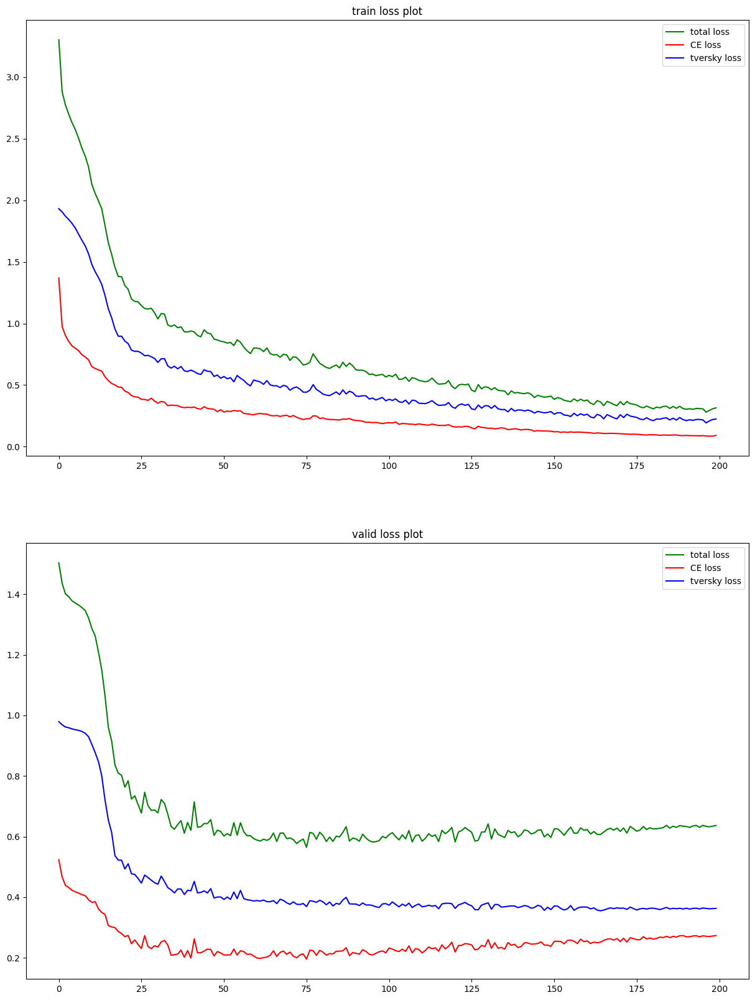

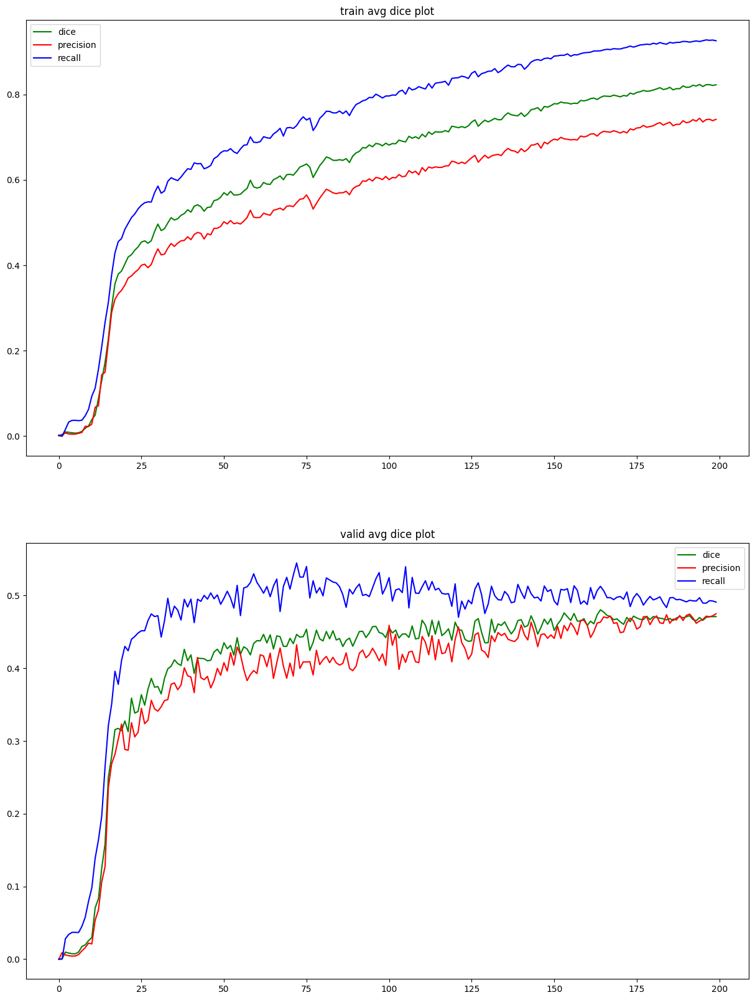

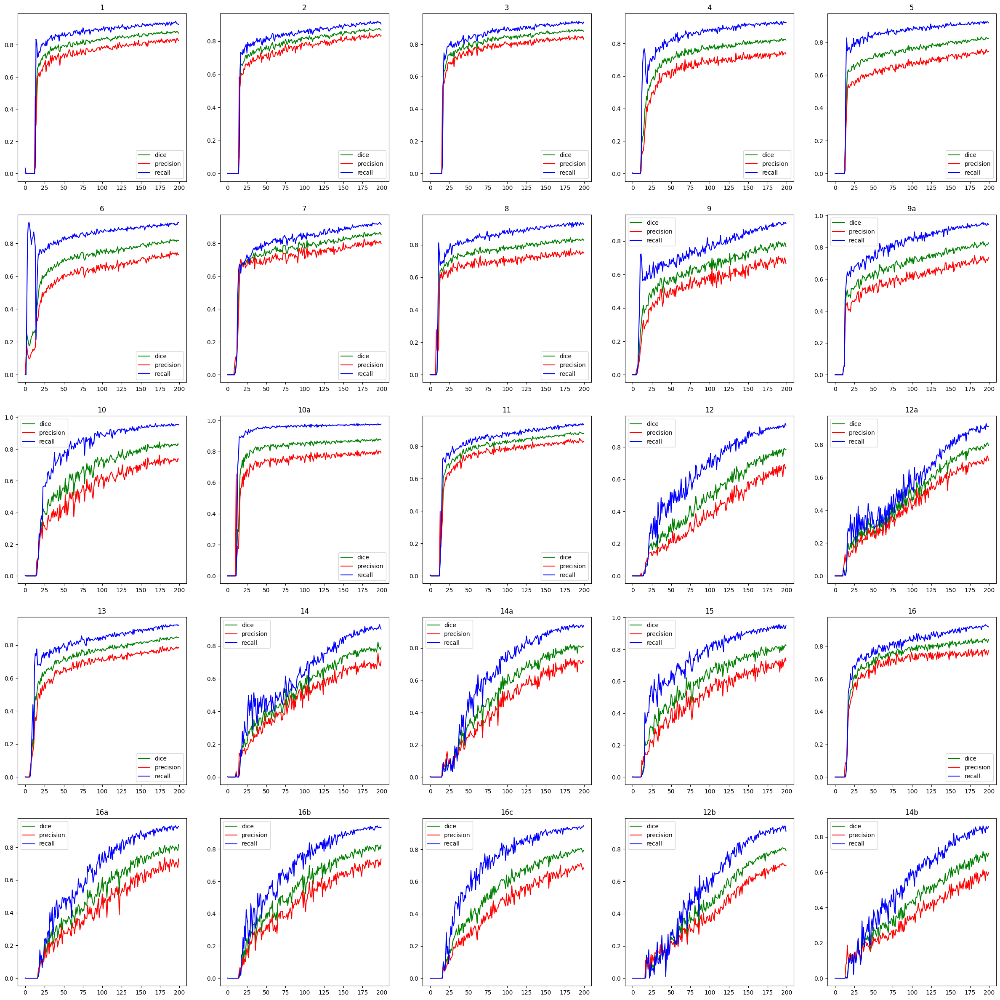

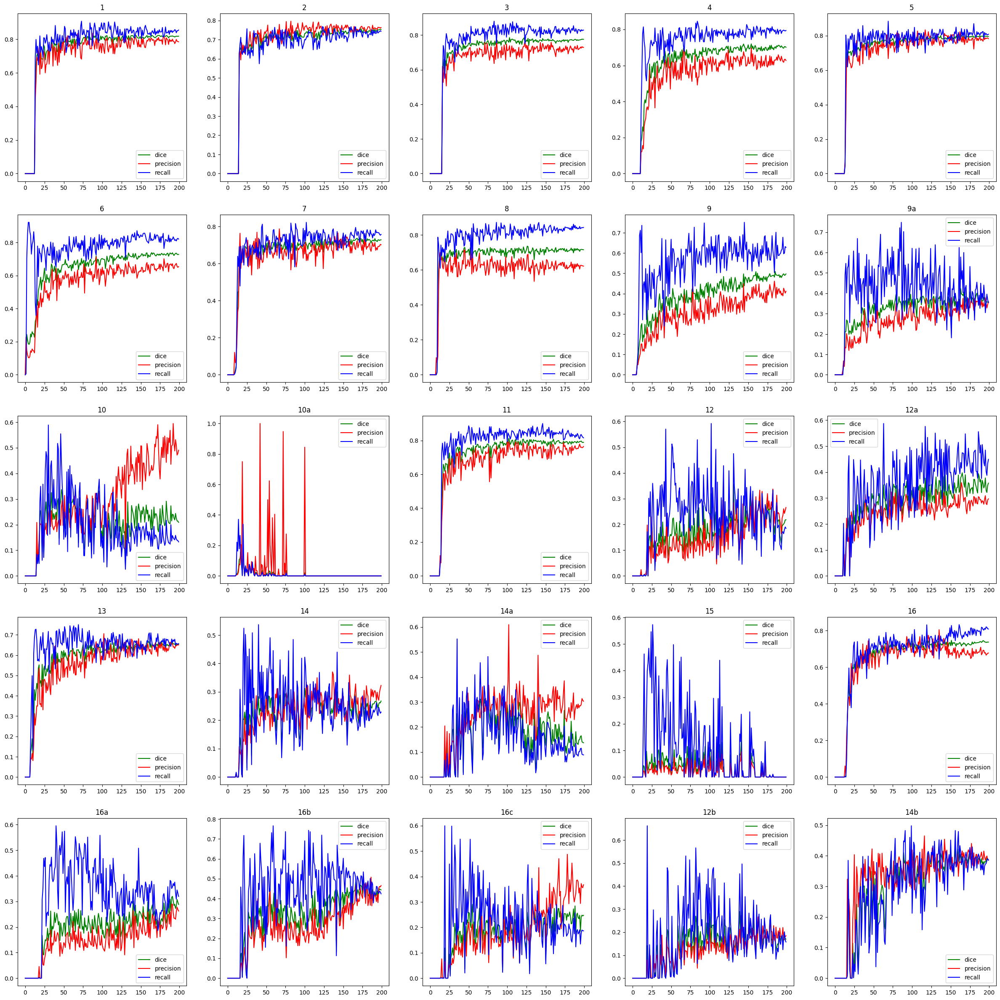

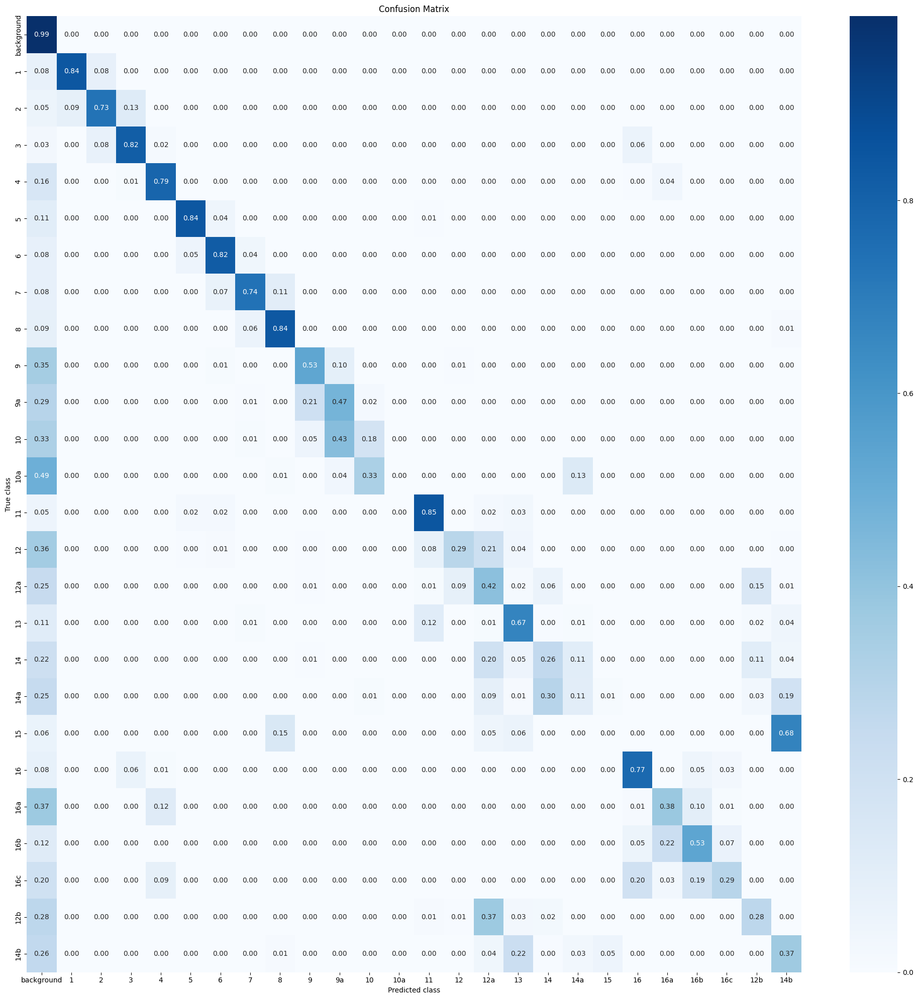

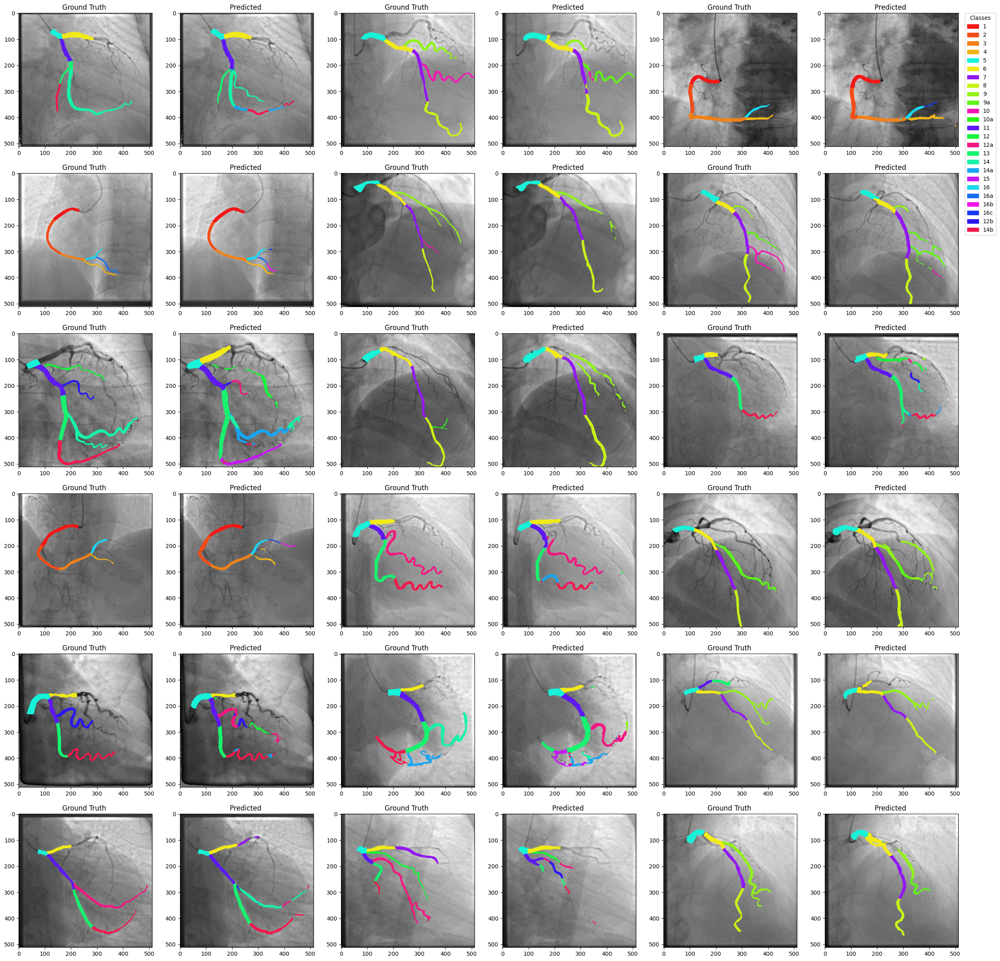

In [11]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    args=args,
    class_map=class_map,
    name=args["name"]
)